## Importing relevant libraries

In [1]:
import numpy as np
import scipy.linalg as la
import scipy.spatial as spat
from scipy.stats import unitary_group
from scipy.stats import moment
from scipy.stats import skew, kurtosis
from scipy.optimize import curve_fit
from scipy.linalg import norm
import matplotlib.pyplot as plt
import math
from dataclasses import dataclass

# Libraries for implementing the VQD algorithm
from qiskit.circuit import QuantumCircuit, Parameter, ParameterVector, Gate
from qiskit.primitives import Sampler, Estimator
from qiskit_aer import AerSimulator
from qiskit_algorithms.utils import algorithm_globals
from qiskit_ibm_runtime import QiskitRuntimeService, Sampler, Session, Options
from qiskit_ibm_runtime import Estimator as EstimatorNew
from qiskit.quantum_info.operators import Operator
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit.library import RealAmplitudes, TwoLocal, EfficientSU2
from qiskit_algorithms.optimizers import *
from qiskit_algorithms.state_fidelities import ComputeUncompute

from qiskit_algorithms.eigensolvers import EigensolverResult, VQD
from qiskit_algorithms import NumPyMinimumEigensolver, VQE

# Import classical optimizers
from qiskit_algorithms.optimizers import SPSA, P_BFGS, COBYLA, IMFIL, SNOBFIT, NELDER_MEAD, SLSQP, NFT, ADAM, POWELL, GradientDescent, BOBYQA

# Import Statevector and SparsePauliOp
from qiskit.quantum_info import SparsePauliOp, Statevector

# Import noise models
from qiskit_aer.noise import (
    NoiseModel,
    QuantumError,
    ReadoutError,
    depolarizing_error,
    pauli_error,
    thermal_relaxation_error,
)

# Import a fake backend and Qiskit simulators and/or noise libraries
from qiskit_aer import AerSimulator
# from qiskit_aer.primitives import Estimator as AerEstimator 
# from qiskit_aer.noise import NoiseModel

# Import the FakeManila backend
from qiskit_ibm_runtime.fake_provider import FakeManilaV2, FakeMontrealV2, FakeGuadalupeV2, FakeManila

## Constructing the FPE operator

In [5]:
## Classical implementation
"""
Purpose: 
    Find the analytical solution given the input parameters
Input: 
    x: array representing the x coordinates over which the solution is to be found
    a, Γ: parameters for the Ornstein-Uhlenbeck equation
Output:
    y: array of the value of the analytical solution over x
"""

def OrnsteinUhlenbeck(x, a = 1, gamma = 1):
    y = np.sqrt(a/(2*np.pi*gamma)) * np.exp((-a * x ** 2)/(2*gamma))
    
    return y

"""
Purpose:
    Calculate the weighted Hermite polynomials using recursive relations up to H_n
Input:
    n: the highest number of Hermite polynomials to be evaluated at
    x: the value of x at which the weighted Hermite polynomials are to be evaluated
Output:
    Hermite: the value of the weighted Hermite polynomials
Example: HermiteSeries(2, 4) -> [H_0(4), H_1(4), H_2(4)]
"""

def HermiteSeries(n, x):
    Hermite = np.zeros((1, n+1))
    Hermite[0][0] = 1.0 * np.exp(-x**2/2)
    Hermite[0][1] = 2.0 * x *np.exp(-x**2/2)
    
    for ni in range(1, n):
        Hermite[0][ni+1] = 2*x*Hermite[0][ni] - 2*ni*Hermite[0][ni-1]
    
    return Hermite

"""
Purpose:
    Reconstruct the functions represented by the coefficients of weighted Hermite polynomials in spatial coordinates
Input:
    x: array containing the x values over which the function is to be evaluated
    coefficients: the coefficients corresponding to the Hermite polynomials (should be zero-mode of the operator)
    nmax: the highest order of weighted Hermite polynomials used
    s: the scaling factor
Output:
    y: the reconstruction
"""

def project(x, coefficients, nmax, s):
    
    y = np.zeros(x.shape)
    
    for i in (range(len(x))):
        x0 = s*x[i]
        hermite_values = HermiteSeries(nmax, x0)
        y[i] += np.dot(hermite_values, coefficients)
        
    return (x, y)

"""
Purpose:
    Normalize the PDF so that the area under the curve is 1
Input:
    x, y: arrays representing the unnormalized
Output:
    (x, y): normalized PDF
"""

def normalize(x, y):
    dx = x[1] - x[0]
    sum = 0
    
    for i in range(len(x)):
        sum = sum + (y[i] * dx)
    
    y = y/sum
    
    return (x, y)

"""
Purpose:
    Calculate the RMS
Input:
    y_op, y: the y values generated by the operator and the analytical solution
Output:
    RMS
"""

def rms_diff(y_op, y):
    return np.sqrt(np.sum((y_op-y)**2)/len(y))

"""
Purpose:
    Find s given a and Γ such that the projection in Hermite space is just H_0
Input:
    a, Γ: parameters for Ornstein-Uhlenbeck
Output:
    s
"""

def special_s(a, gamma):
    return np.sqrt(a/gamma)

def euler_representation(z):
    A = abs(z)
    phase = math.atan(z.imag/z.real)
    
    return A, phase

def generate_positive_semidefinite_matrix(eigenvalues):
    ## Function to transform the FPE operator to the Hermite basis and return a finite truncated matrix for the ...
    ## ... FPE operator
    
    n = len(eigenvalues)
    s = np.diag(eigenvalues)
    q, _ = la.qr(np.random.rand(n, n))
    semidef = np.dot(np.transpose(q), s)
    semidef = np.dot(semidef, q)
    
    return semidef

def normalize_probability(y, dx):
    ## Function to return a normalized PDF 
    
    total = np.sum(y) * dx
    y = y / total
    
    return y

def perturbed_ornstein_uhlenbeck(x0, a = 1, gamma = 1, c = 0, shift = 0):
    ## Function to compute the exact solution to the perturbed Ornstein-Uhlenbeck equation
    
    assert len(x0) > 1, "Error: x0 should be a vector"

    x = x0 - shift
    y = np.exp(-a*x**2 /(2*gamma) - c*x**4 /(4*gamma))
    dx = x[2] - x[1]
    
    y = normalize_probability(y, dx)
    
    return y

def special_L(a, gamma):
    ## Function to compute the characteristic length scale
    
    return np.sqrt(a/gamma)

def delta(N, n):
    ## Function to implement the Kronecker delta function
    
    if N == n:
        return 1
    else:
        return 0
    
def matrix_element(N, n, L):
    # Function to compute the matrix elements of the position operator
    
    value = L/np.sqrt(2) * (np.sqrt(n) * delta(N, n-1) + np.sqrt(n+1) * delta(N, n+1))
    
    return value

def create_position(nmax, L):
    # Function to construct the position operator
    
    op = np.zeros((nmax + 1, nmax + 1))
    
    for N in range(nmax+1):
        row = N
        for n in range(nmax+1):
            col = n
            op[row, col] = matrix_element(N, n, L)
            
    return op

def f(N,n):
    return 0.5*( np.sqrt(n*(n-1))*delta(N,n-2) + delta(N,n) - np.sqrt((n+1)*(n+2))*delta(N,n+2))

def g(N,n, L):
    return (0.5 / L**2)*( np.sqrt(n*(n-1))*delta(N,n-2) - (2*n+1)*delta(N,n) + np.sqrt((n+1)*(n+2))*delta(N,n+2))

def t(N, n, L):
    val1 = np.sqrt(n*(n-1)*(n-2)*(n-3))*delta(N, n-4)
    val2 = (2*n+2)*np.sqrt(n*(n-1))*delta(N, n-2)
    val3 = (6*n+3)*delta(N, n)
    val4 = -2*n*np.sqrt((n+1)*(n+2))*delta(N, n+2)
    val5 = -1*np.sqrt((n+1)*(n+2)*(n+3)*(n+4))*delta(N, n+4)

    return (L**2/4)*( val1 + val2 + val3 + val4 + val5 )

def element_perturbed(N, n, L, a, c, gamma):
    ## Function to compute the matrix elements of the finite truncated matrix for the FPE operator (in the Hermite basis)
    
    return -(a*f(N,n) + c*t(N, n, L) + gamma*g(N, n, L))

def create_operator_perturbed(nmax, L, a, c, gamma):
    ## Function to generate the FPE operator matrix in the Hermite basis
    op = np.zeros((nmax+1, nmax+1))
    
    for N in range(nmax+1):
        row = N
        for n in range(nmax+1):
            col = n
            op[row, col] = element_perturbed(N, n, L, a, c, gamma)
    
    """
    if np.any(np.nan, op):
        print("There's an nan in the operator")
    elif np.any(np.inf, op):
        print("There is an inf in the operator")
    """

    return op

def state_n(nmax, x0, L):
    ## Function to compute the Hermite polynomials upto the order specified by nmax
    
    assert L > 0, "Error (state_n): input L must be greater than or equal to 0"

    states = np.zeros(nmax + 1)
    x = x0 / L

    states[0] = np.sqrt(L / np.sqrt(1/np.pi))* 1.0 * np.exp(-x**2/2)

    if nmax > 0:
        states[1] = np.sqrt(L / np.sqrt(1/np.pi))* (1/np.sqrt(2)) * 2.0 * x * np.exp(-(x**2)/2)
    
    for ni in range(2, nmax + 1):
        states[ni] = ((np.sqrt(2)*x) / np.sqrt(ni))*states[ni-1] - (ni-1)/np.sqrt((ni)*(ni-1))*states[ni-2]

    return states

def integrate_eigenvector(x0, y, nmax, L):
    ## Function to compute the coefficients corresponding to the calculated Hermite polynomials by numerical integration
    ## Note: here, we use the left-hand integration method
    
    dx = x0[2] - x0[1]
    eigenvector = np.zeros(nmax + 1)

    for i in range(len(x)):

        states = state_n(nmax, x0[i], L)
        states = states * y[i] * dx

        eigenvector = eigenvector + states
        
    return {"eigenvector" : eigenvector, "dx" : dx, "nmax" : nmax, "x0" : x0, "L" : L}

def make_operator_even(op):
    op_new = np.zeros((op.shape[0]//2, op.shape[1]//2))
    
    for row in range(op_new.shape[0]):
        for col in range(op_new.shape[1]):
            op_new[row, col] = op[row*2, col * 2]
    
    return op_new

def reconstruct_eigenvector(cache, normalize = True, only_even = False):
    ## Function to reconstruct the PDF using the cache obtained previously
    
    eigenvector = cache["eigenvector"]
    nmax = cache["nmax"]
    x0 = cache["x0"]
    dx = cache["dx"]
    L = cache["L"]
    
    if not only_even:
        eigenvector = cache["eigenvector"]
    else:
        eigenvector_old = cache["eigenvector"]
        eigenvector = np.zeros(nmax + 1)
        
        for i in range(len(eigenvector_old)):
            eigenvector[2*i] = eigenvector_old[i]

    y = np.zeros(len(x0))

    for i in range(len(x0)):
        states = state_n(nmax, x0[i], L)
        y[i] += (np.dot(states, eigenvector))
    if normalize:   
        y = normalize_probability(y, dx)
        
    return (x0, y)

def find_zeromode(op_nonhermitian, nmax, x0, dx, L, which = "single", only_even = False):
    ## Function to compute the zeromode, its position, and the eigenvalue corresponding to the zeromode
    
    assert which == "nonhermitian" or which == "single", "Error: currently only supports which = {\"nonhermitian\", \"single\"}"
    
    if only_even:
        op_processed = make_operator_even(op_nonhermitian)
    else:
        op_processed = op_nonhermitian
        
    if which == "nonhermitian":
        op = op_processed
    elif which == "single":
        op = np.dot(np.transpose(op_processed), op_processed)

    eigenvalues, eigenvectors = la.eig(op)

    index = np.argmin(np.real(eigenvalues)**2)

    min_eigenval = eigenvalues[index]
    
    zeromode = eigenvectors[:, index]

    return {"operator" : op, "which" : which, \
            "eigenvector" : np.real(zeromode), "index" : index, "eigenvalue" : np.real(min_eigenval), \
            "nmax" : nmax, "x0" : x0, "dx" : dx, "L" : L, "spectrum" : eigenvalues, "P" : eigenvectors}

def rms_diff(y0, y, sigdigits = 0):
    ## Function to compute the RMS difference between the analytically computed PDF and the one ...
    ## ... obtained using the FPE operator
    
    assert len(y0) == len(y), "Error: the length of y0 and y should be the same"
    diff = np.sum((y0-y)**2)/len(y0)
    
    return np.sqrt(diff)

def analyze_collapse(initial_state, P, index):
    num_basis = P.shape[1]
    coefficients = np.zeros((num_basis, ))

    for i in range(num_basis):
        basis = P[:, i]
        basis = normalize_eigenvector(basis)

        coefficients[i] = np.dot(basis, initial_state)

    normalized_coefficients = normalize_eigenvector(coefficients)

    reconstruction = np.zeros((P.shape[0], ))

    for i in range(num_basis):
        basis = P[:, i]
        basis = normalize_eigenvector(basis)

        added_vector = coefficients[i] * basis
        reconstruction = reconstruction + added_vector

    probability = normalized_coefficients ** 2
    
    probability_zeromode = probability[index]
    assert np.sum(probability) - 1 < 0.00001, "Error: unity normalization of probability is not observed"

    print("The initial_state is: ")
    print(initial_state)
    print()

    print("The coefficient expansion is: ")
    print(coefficients)
    print()

    print("The normalized coefficient expansion is: ")
    print(normalized_coefficients)
    print()

    print("The reconstructed vector is: ")
    print(reconstruction)
    print()

    print("The probability of collapsing into each eigenvector is: ")
    print(probability)
    print()

    print("The probability of collapsing into the zeromode is: ")
    print(probability_zeromode)
    print()
    
    return probability_zeromode, probability

def get_unitary(matrix, add_half = False):
    """
    Purpose: given a matrix, returns the unitary, hermitian matrix to be diagonalized
    Input: matrix -> the matrix to be diagonalized
    Output: U -> the unitary matrix
            nqubits -> the number of qubis needed to represent the basis of U
            dimension -> the dimension of the original matrix
    """
    assert matrix.ndim == 2, "Error: Only a matrix maybe processed"
    assert matrix.shape[0] == matrix.shape[1], "Error: Only a square matrix maybe processed"

    if np.any(np.transpose(matrix) != matrix):
        matrix_T = np.transpose(matrix)
        matrix = np.dot(matrix_T, matrix)

    ## Finding the dimension of the matrix
    dimension_hermitian = matrix.shape[0]

    ## Finding the number of qubits required to represent the matrix
    nqubits = int(np.ceil(np.log2(dimension_hermitian)))

    ## Construct the relevant matrix
    op_dim = 2 ** nqubits
    op = np.eye(op_dim)
    op[0:dimension_hermitian, 0:dimension_hermitian] = np.copy(matrix)

    if add_half:
        op = op + np.pi * np.eye(op.shape[0])

    U = la.expm(1j*op)

    # Get the dimensions of the unitary matrix
    dimension = U.shape[0]

    return U, nqubits, dimension

def expect_value(zeromode, matrix):
    
    value = np.dot(matrix, zeromode)
    expect = np.dot(np.transpose(zeromode), value)
    
    return expect

## Helper functions

In [8]:
def find_probability(eigenvector_raw):
    """
    Purpose: Find the probability associated with each basis of an eigenvector
    Input: eigenvector_raw -> Numpy array documenting the number of times each basis is detected within the eigenvector
    Output: eigenvector_prob -> Numpy array documenting the probability of detecting each basis
    """
    count_total = np.sum(eigenvector_raw)
    eigenvector_prob = eigenvector_raw / count_total
    
    return eigenvector_prob

def find_amplitude(eigenvector_prob):
    """
    Purpose: Finding the probability amplitude of each basis using quantum mechanics
    Input: eigenvector_prob -> Numpy array documenting the probability that each basis is measured
    Output: eigenvector -> Numpy array representing the eigenvector
    """
    eigenvector = np.sqrt(eigenvector_prob)
    return eigenvector

def normalize_eigenvector(vector):
    """
    Purpose: Normalizes a vector such that its norm is 1
    Input: vector -> The vector to be normalized
    Output: vector -> The normalized vector
    """
    L2 = np.sum(np.square(vector))
    vector = vector / np.sqrt(L2)

    return vector

def make_operator_even(op):
    op_new = np.zeros((op.shape[0]//2, op.shape[1]//2))

    for row in range(op_new.shape[0]):
        for col in range(op_new.shape[1]):
            op_new[row, col] = op[row*2, col * 2]

    return op_new

def get_pdf(n, x, dx, L, shift, zeromode_qpe, normalize = True, make_even = False):
    # Function to construct the ground state PDF using the VQSVD zeromode
    
    if not make_even:
        eigenvector = zeromode_qpe
    else:
        eigenvector_old = zeromode_qpe
        eigenvector = np.zeros(n + 1)
        for i in range(len(eigenvector_old)):
            eigenvector[2*i] = eigenvector_old[i]
            
    x0 = x - shift
    
    # Computing the PDF
    y = np.zeros(len(x0))

    for i in range(len(x0)):
        states = state_n(nmax, x0[i], L)
        y[i] += (np.dot(states, eigenvector))
    
    if normalize:
        y = normalize_probability(y, dx)

    return x0, y

def compute_expectation_x_squared_simpson(x, y, n):
    """
    Computes the expectation value of x^2 using Simpson's rule for numerical integration.
    
    Parameters:
    x (array-like): Discrete values of x.
    y (array-like): Corresponding values of the probability density function (PDF) at x.
    
    Returns:
    float: The expectation value of x^2.
    """
    # Ensure x and y are numpy arrays
    x = np.array(x)
    y = np.array(y)
    
    # Compute x^2
    x_squared = x**n
    
    # Check if the number of intervals is even, if not make it even by truncating the last point
    if len(x) % 2 == 0:
        x = x[:-1]
        y = y[:-1]
        x_squared = x_squared[:-1]
    
    # Compute the integral using Simpson's rule
    h = (x[-1] - x[0]) / (len(x) - 1)
    integral = y[0] * x_squared[0] + y[-1] * x_squared[-1] + \
               4 * np.sum(y[1:-1:2] * x_squared[1:-1:2]) + \
               2 * np.sum(y[2:-2:2] * x_squared[2:-2:2])
    integral *= h / 3
    
    return integral

def get_pdf(n, x, dx, L, shift, zeromode_qpe, normalize = True, make_even = False):
    # Function to construct the ground state PDF using the VQSVD zeromode
    
    if not make_even:
        eigenvector = zeromode_qpe
    else:
        eigenvector_old = zeromode_qpe
        eigenvector = np.zeros(n + 1)
        for i in range(len(eigenvector_old)):
            eigenvector[2*i] = eigenvector_old[i]
            
    x0 = x - shift
    
    # Computing the PDF
    y = np.zeros(len(x0))

    for i in range(len(x0)):
        states = state_n(nmax, x0[i], L)
        y[i] += (np.dot(states, eigenvector))
    
    if normalize:
        y = normalize_probability(y, dx)

    return x0, y

# Fidelity measure 1
def get_fidelity(zeromode_classic, zeromode_vqe):
    # Function to compute the infidelity

    overlap = np.dot(np.transpose(zeromode_vqe), zeromode_classic)
    fidelity = 1 - overlap ** 2
    return fidelity

# Fidelity measure 2
def get_similarity(a, b):
    # Function to compute the similarity between 2 zeromodes
    
    numerator = np.abs(np.dot(a.conj().T, b))**2
    denominator = np.linalg.norm(a)**2 * np.linalg.norm(b)**2
    
    return numerator / denominator

def compute_errors(expect_classical, expect_quantum):

    error = np.abs(expect_classical - expect_quantum) / expect_classical
    return error

## VQE implementation

In [11]:
# VQE run for a given ansatz and optimizer
def run_vqe_ansatz_analysis(matrix, ansatz, optimizer, seed, exact_ground_state):

    # Get the Pauli-decomposed form of the operator
    qub_hamiltonian = SparsePauliOp.from_operator(matrix)
    dimension = matrix.shape[0]
    num_qubits = int(np.log2(dimension))

    # Set up the random initial point
    np.random.seed(seed)
    initial_point = np.random.uniform(-np.pi, np.pi, ansatz.num_parameters)

    # Initialize the Estimator primitive
    estimator = Estimator()

    # Logging class for VQE callback
    @dataclass
    class VQELog:
        parameters: list
        values: list
        def update(self, count, parameters, mean, _metadata):
            self.values.append(mean)
            self.parameters.append(parameters)
            
    log = VQELog([], [])
    
    # Run VQE with the given ansatz and optimizer
    vqe = VQE(estimator, ansatz, optimizer, initial_point=initial_point, callback=log.update)

    # Get the VQE results
    result = vqe.compute_minimum_eigenvalue(qub_hamiltonian)

    # Get the number of optimizer function calls
    num_calls = len(log.values)

    # Extract the optimal parameters and construct the state vector
    optimal_params = result.optimal_point
    final_circuit = ansatz.assign_parameters(optimal_params)
    vqe_statevector = Statevector.from_instruction(final_circuit)

     # Convert the quantum and classical zeromodes into 4 x 1 arrays
    exact_ground_state = np.array(exact_ground_state).reshape((len(exact_ground_state), 1))
    vqe_statevector = vqe_statevector.data.tolist()

    if len(exact_ground_state) == 6:
        vqe_statevector = vqe_statevector[:6]
        zeromode = np.array(vqe_statevector).reshape((len(exact_ground_state), 1))
        zeromode = np.real(zeromode)
    
        # Compute the fidelity measure
        fidelity_value = get_similarity(exact_ground_state, zeromode)
    
    else:
        zeromode = np.array(vqe_statevector).reshape((len(exact_ground_state), 1))
        zeromode = np.real(zeromode)
    
        # Compute the fidelity measure
        fidelity_value = get_similarity(exact_ground_state, zeromode)
    
    return zeromode, fidelity_value, num_calls

## Construct the matrix and get the zeromode

In [14]:
def get_zeromode(nmax, a, c, L, gamma):
    # Function to construct the matrix and get the zeromode

    #3, 5, 1, 1
    dx = 0.01
    x = np.linspace(-4, 4, int((8)/dx))
    
    ## Finding the zeromode through diagonalization
    op_nonhermitian = create_operator_perturbed(nmax, L, a, c, gamma)
    only_even = True
    
    # Matrix
    cache_diagonalization = find_zeromode(op_nonhermitian, nmax, x, dx, L, which = "single", only_even = only_even)
    matrix = cache_diagonalization['operator']

    # Get the classical zeromode
    A, P = la.eig(matrix)
    
    # Get the zeromode
    A_real = np.real(A)
    index = np.where(A_real == np.amin(A_real))[0][0]
    
    eigenvalue = A[index]
    zeromode_classic = P[:, index]
    
    zeromode_classic = np.real(normalize_eigenvector(zeromode_classic))
    zeromode_classic = np.reshape(zeromode_classic, (zeromode_classic.size, 1))

    return matrix, zeromode_classic

## Estimate quantum resources

In [17]:
def estimate_resources(matrix, zeromode_classic, optimizers, num_qubits, target_fidelity_threshold):
    
    # Initial depth and maximum depth
    initial_depth = 1
    max_depth = 10  # Set the maximum number of depths to check

    # Initialize dictionaries to store minimum depths, zeromodes, and resources for each optimizer-ansatz pair
    min_depths = {}
    zeromodes = {}
    resource_info = {}  # To store gate count, circuit depth, and function calls
    
    # Loop through each optimizer
    for optimizer in optimizers:
        optimizer_name = optimizer.__class__.__name__
        
        # Loop through each ansatz type and configure dynamically
        for AnsatzClass in [RealAmplitudes, TwoLocal, EfficientSU2]:
            # Initialize ansatz with appropriate configurations
            if AnsatzClass == RealAmplitudes:
                ansatz = AnsatzClass(num_qubits=num_qubits, entanglement='full', reps=initial_depth)
            elif AnsatzClass == TwoLocal:
                ansatz = AnsatzClass(num_qubits=num_qubits, rotation_blocks=['ry'], entanglement_blocks='cx', reps=initial_depth)
            elif AnsatzClass == EfficientSU2:
                ansatz = AnsatzClass(num_qubits=num_qubits, su2_gates=['ry'], entanglement='sca', reps=initial_depth)
            
            ansatz_name = AnsatzClass.__name__
            pair_name = f"{optimizer_name}-{ansatz_name}"
            print(f"\nRunning VQE for optimizer-ansatz pair: {pair_name}")
            
            current_depth = initial_depth
            converged = False  # Flag to check if convergence occurs
            
            while current_depth <= max_depth:  # Loop for up to max_depth
                # Set `reps` (depth) for the current ansatz
                ansatz.reps = current_depth
                
                # Temporary storage for the fidelity results
                fidelities = []
                function_calls = []  # To track the number of function calls for each run
                all_zeromodes = []  # To store all zeromodes for the depth
                
                # Perform multiple independent VQE runs to calculate average fidelity
                for run in range(10):  # Number of independent runs
                    # Set a seed for a specific VQE run
                    seed = run + 1
                    
                    # Run VQE
                    zeromode, fidelity_value, function_call_count = run_vqe_ansatz_analysis(
                        matrix=matrix, ansatz=ansatz, optimizer=optimizer, seed=seed,
                        exact_ground_state=zeromode_classic)
                    
                    # Append the fidelity result and function call count
                    fidelities.append(fidelity_value)
                    function_calls.append(function_call_count)
                    all_zeromodes.append(zeromode)
                
                # Calculate the average fidelity over the runs
                average_fidelity = np.mean(fidelities)
                print(f"{pair_name} - Depth {current_depth}: Average fidelity = {average_fidelity}")
        
                # Check if the average fidelity meets the threshold
                if average_fidelity >= target_fidelity_threshold:
                    min_depths[pair_name] = current_depth
                    converged = True
                    
                    # Identify the run with the highest fidelity at this depth
                    best_run_index = np.argmax(fidelities)
                    best_fidelity = fidelities[best_run_index]
                    best_zeromode = all_zeromodes[best_run_index]
                    best_function_calls = function_calls[best_run_index]
                    
                    # Print the run number and highest fidelity at optimal depth
                    print(f"Optimal depth {current_depth} for {pair_name} achieved highest fidelity = {best_fidelity}")
                    print(f"Run number with highest fidelity: {best_run_index + 1}")
                    
                    # Calculate gate count and circuit depth for the ansatz at this depth
                    decomposed_ansatz = ansatz.decompose()  # Decompose to get actual gate operations
                    gate_count_dict = decomposed_ansatz.count_ops()
                    total_gates = sum(gate_count_dict.values())
                    circuit_depth = decomposed_ansatz.depth()
                    
                    # Store zeromode and resource information
                    zeromodes[pair_name] = best_zeromode
                    resource_info[pair_name] = {
                        'gate_count': total_gates,
                        'circuit_depth': circuit_depth,
                        'function_calls': best_function_calls
                    }
                    
                    print(f"Zeromode at optimal fidelity for {pair_name}: {best_zeromode}")
                    print(f"Resource estimates for {pair_name}: Gate count = {total_gates}, Circuit depth = {circuit_depth}, Function calls = {best_function_calls}")
                    
                    break  # Exit the loop if the threshold is met
        
                current_depth += 1  # Increase depth and try again
            
            # If the loop finishes and no convergence occurs, mark as "did not converge"
            if not converged:
                min_depths[pair_name] = "Did not converge"
                zeromodes[pair_name] = "Did not converge"
                resource_info[pair_name] = {
                    'gate_count': "N/A",
                    'circuit_depth': "N/A",
                    'function_calls': "N/A"
                }
                print(f"{pair_name} did not converge within {max_depth} depths.")
    
    return min_depths, zeromodes, resource_info

## Quantum analysis

### For a = 1 (N = 2)

### Get the matrix and the zeromode

In [24]:
## Get the matrix and zeromode
nmax = 3
a = 1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[  5.765625   -21.34578596]
 [-21.34578596  79.265625  ]]

The zeromode is:
[[-0.96558703]
 [-0.26008015]]

The value of <x^2> is:
0.41050077276583463

[[  5.765625   -21.34578596]
 [-21.34578596  79.265625  ]]


C:\Users\Owner\AppData\Local\Temp\ipykernel_13120\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Min. ansatz depths (fix at 5000 optimization iterations)

In [33]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_2, zeromodes_N_2, resources_N_2 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.979707495176598
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9999999998235447
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[-0.96558703]
 [-0.26008016]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 3, Circuit depth = 3, Function calls = 22

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999999997161207
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[0.96558702]
 [0.26008019]]
Resource estimates for SLSQP-TwoLocal: Gate count = 2, Circuit depth = 2, Function calls = 20

Running VQE for optimizer-ansatz pair: SLSQP-EfficientSU2
SLSQP-EfficientSU2 - Depth 1: Average fidelity

For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9999999998235447
Optimal depth 2 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-0.96558703]
 [-0.26008016]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 3, Circuit depth = 3, Function calls = 22

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9797074952913822


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.7202925047086175


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 0.9999999999999998
Optimal depth 3 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[0.96558703]
 [0.26008014]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 4, Circuit depth = 4, Function calls = 35

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9999999999999986
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[-0.96558703]
 [-0.26008014]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 2, Circuit depth = 2, Function calls = 21

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9797074952913822


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.7202925047086175


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 0.9999999999999998
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[0.96558703]
 [0.26008014]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 4, Circuit depth = 4, Function calls = 35

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999999999886793
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[0.96558703]
 [0.26008015]]
Resource estimates for NELDER_MEAD-RealAmplitudes: Gate count = 2, Circuit depth = 2, Function calls = 92

Running VQE for optimizer-ansatz pair: NELDER_MEAD-TwoLocal
NELDER_MEAD-TwoLocal - Depth 1: Average fidelity = 0.9999999999886793
Optimal depth 1 for NELDER_MEAD-TwoLocal achieved 

### Print resource estimates

In [36]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_2)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_2)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 2, 'P_BFGS-RealAmplitudes': 3, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 1, 'POWELL-RealAmplitudes': 1, 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 1}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 3, 'circuit_depth': 3, 'function_calls': 22}, 'SLSQP-TwoLocal': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 20}, 'SLSQP-EfficientSU2': {'gate_count': 3, 'circuit_depth': 3, 'function_calls': 22}, 'P_BFGS-RealAmplitudes': {'gate_count': 4, 'circuit_depth': 4, 'function_calls': 35}, 'P_BFGS-TwoLocal': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 21}, 'P_BFGS-EfficientSU2': {'gate_count': 4, 'circuit_depth': 4, 'function_calls': 35}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 92}, 'NELDER_MEAD-TwoLocal': {'gate

### Estimate the relative errors in <x^2>

In [38]:
# Get the zeromodes
zeromodes = list(zeromodes_N_2.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[1.570938146261891e-08, 5.272217918149814e-08, 1.570938146261891e-08]

The errors for P-BFGS are:
[6.340211173568491e-09, 7.518450111549826e-09, 6.340211173568491e-09]

The errors for NELDER-MEAD are:
[2.435276111061158e-09, 2.435276111061158e-09, 2.435276111061158e-09]

The errors for POWELL are:
[2.5244204964017904e-09, 1.346735857520463e-09, 2.5244204964017904e-09]



### For a = 1 (N = 4)

### Get the matrix and the zeromode

In [40]:
## Get the matrix and zeromode
nmax = 7
a = 1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[   6.140625    -23.4671063    35.51760127   -9.22378041]
 [ -23.4671063    96.890625   -151.66269884  111.47028752]
 [  35.51760127 -151.66269884  376.140625   -354.47919269]
 [  -9.22378041  111.47028752 -354.47919269  972.890625  ]]

The zeromode is:
[[-0.97335411]
 [-0.22648723]
 [ 0.02489903]
 [ 0.02579447]]

The value of <x^2> is:
0.32868055910006333



C:\Users\Owner\AppData\Local\Temp\ipykernel_36608\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Estimate min. ansatz depths (fix at 5000 optimization iterations)

In [43]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_4, zeromodes_N_4, resources_N_4 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9821334689710343
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9049462053812316
SLSQP-RealAmplitudes - Depth 3: Average fidelity = 0.9999999995748416
Optimal depth 3 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[ 0.97335449]
 [ 0.22648546]
 [-0.02490006]
 [-0.02579462]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 11, Circuit depth = 7, Function calls = 193

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999999991436397
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[ 0.97335353]
 [ 0.22648987]
 [-0.02489742]
 [-0.02579451]]
Resource estimates for SLSQP-TwoLocal: Gate count = 5, Circuit d

For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9944553701270165
Optimal depth 2 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-0.973354  ]
 [-0.22648796]
 [ 0.02489685]
 [ 0.02579402]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 8, Circuit depth = 5, Function calls = 126

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9819037942607987


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.8100758461549373


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 0.9940356884537034
Optimal depth 3 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[ 0.97335411]
 [ 0.22648722]
 [-0.02489904]
 [-0.02579447]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 11, Circuit depth = 7, Function calls = 711

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9999999999999849
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 4
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[ 0.97335411]
 [ 0.22648721]
 [-0.02489903]
 [-0.02579445]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 5, Circuit depth = 3, Function calls = 85

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9819037942607987


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.988345622059116


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 0.9999999999999899
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[-0.97335411]
 [-0.22648723]
 [ 0.02489903]
 [ 0.02579447]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 11, Circuit depth = 7, Function calls = 396

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999999995736684
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[-0.97335359]
 [-0.22649001]
 [ 0.02489167]
 [ 0.02579665]]
Resource estimates for NELDER_MEAD-RealAmplitudes: Gate count = 5, Circuit depth = 3, Function calls = 175

Running VQE for optimizer-ansatz pair: NELDER_MEAD-TwoLocal
NELDER_MEAD-TwoLocal - Depth 1: Average fidelity = 0.

### Print resource estimates

In [46]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_4)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_4)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 3, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 2, 'P_BFGS-RealAmplitudes': 3, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 1, 'POWELL-RealAmplitudes': 5, 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 3}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 193}, 'SLSQP-TwoLocal': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 183}, 'SLSQP-EfficientSU2': {'gate_count': 8, 'circuit_depth': 5, 'function_calls': 126}, 'P_BFGS-RealAmplitudes': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 711}, 'P_BFGS-TwoLocal': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 85}, 'P_BFGS-EfficientSU2': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 396}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 175}, 'NELDER_MEAD-TwoLocal

### Compute relative errors in <x^2>

In [48]:
# Get the zeromodes
zeromodes = list(zeromodes_N_4.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[7.308804496809332e-06, 9.889810381076017e-06, 1.0414843193480873e-05]

The errors for P-BFGS are:
[7.067765067259312e-08, 7.341616759904789e-08, 6.17281161420991e-10]

The errors for NELDER-MEAD are:
[1.916148148893346e-05, 1.916148148893346e-05, 1.916148148893346e-05]

The errors for POWELL are:
[4.658566225877019e-06, 5.363263817009758e-08, 7.377928561926636e-06]



### For a = 1 (N = 8)

### Get the matrix and the zeromode

In [32]:
## Get the matrix and zeromode
nmax = 15
a = 1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[ 6.14062500e+00 -2.34671063e+01  3.55176013e+01 -9.22378041e+00
  -3.13747510e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.34671063e+01  9.68906250e+01 -1.51662699e+02  1.11470288e+02
  -6.65558976e+01 -2.10468228e+01  0.00000000e+00  0.00000000e+00]
 [ 3.55176013e+01 -1.51662699e+02  4.02390625e+02 -3.54479193e+02
   1.63951212e+02 -2.30876387e+02 -6.98044143e+01  0.00000000e+00]
 [-9.22378041e+00  1.11470288e+02 -3.54479193e+02  1.05164062e+03
  -5.71772019e+02  1.15363556e+02 -5.86246269e+02 -1.71932490e+02]
 [-3.13747510e+00 -6.65558976e+01  1.63951212e+02 -5.71772019e+02
   2.23364062e+03 -7.19516989e+02 -1.36244266e+02 -1.24067405e+03]
 [ 0.00000000e+00 -2.10468228e+01 -2.30876387e+02  1.15363556e+02
  -7.19516989e+02  4.19739062e+03 -6.89706553e+02 -7.16860080e+02]
 [ 0.00000000e+00  0.00000000e+00 -6.98044143e+01 -5.86246269e+02
  -1.36244266e+02 -6.89706553e+02  6.56939062e+03 -1.15978184e+03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.7

C:\Users\Owner\AppData\Local\Temp\ipykernel_27096\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Convert to tridiagonal form by using the Householder transformation (trial -- doesn't seem to work, though)

In [29]:
def householder_tridiagonalization(matrix):
    """
    Convert a Hermitian matrix to tridiagonal form while preserving eigenvector spectrum.

    Parameters:
        matrix (numpy.ndarray): The Hermitian matrix.

    Returns:
        T (numpy.ndarray): The tridiagonal matrix.
        Q (numpy.ndarray): The unitary matrix such that A = Q @ T @ Q.H.
    """
    if not np.allclose(matrix, matrix.T.conj()):
        raise ValueError("The input matrix must be Hermitian.")

    n = matrix.shape[0]
    Q = np.eye(n)  # Initialize Q as the identity matrix
    T = matrix.copy()  # Work on a copy of the input matrix

    for k in range(n - 2):
        # Extract the Householder vector
        x = T[k + 1:, k]
        norm_x = np.linalg.norm(x)
        sign = -1 if x[0] < 0 else 1
        u1 = x[0] - sign * norm_x
        u = x / u1
        u[0] = 1

        # Compute the Householder transformation
        beta = -sign * u1 / norm_x
        Hk = np.eye(n - k - 1) - beta * np.outer(u, u.conj())

        # Apply the Householder transformation to T
        T[k + 1:, k + 1:] = Hk @ T[k + 1:, k + 1:] @ Hk.T.conj()
        T[k + 1:, k] = Hk @ T[k + 1:, k]
        T[k, k + 1:] = T[k + 1:, k].T.conj()

        # Update Q to accumulate transformations
        Qk = np.eye(n)
        Qk[k + 1:, k + 1:] = Hk
        Q = Q @ Qk

    return T, Q

# Get the tridiagonal matrix
T, Q = householder_tridiagonalization(matrix)

# Print the tridiagonal matrix
print('The tridiagonal matrix is:')
print(T)
print()

# Get the zeromode and see what happens
A, P = la.eig(T)
    
# Get the zeromode
A_real = np.real(A)
index = np.where(A_real == np.amin(A_real))[0][0]

eigenvalue = A[index]
zeromode_classic = P[:, index]

zeromode_classic = np.real(normalize_eigenvector(zeromode_classic))
zeromode_classic = np.reshape(zeromode_classic, (zeromode_classic.size, 1))

# Print the eigenvalues and zeromode
print('The eigenvalues are:')
print(A)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode_classic)
print()

The tridiagonal matrix is:
[[ 6.14062500e+00 -4.36706647e+01  6.21724894e-15 -3.55271368e-15
  -4.44089210e-16  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.36706647e+01  5.90592680e+02  5.02271594e+02 -1.13686838e-13
   4.26325641e-14 -5.68434189e-14  1.42108547e-14  2.84217094e-14]
 [ 6.21724894e-15  5.02271594e+02  2.59549689e+03 -2.38757910e+03
   2.27373675e-13  4.83169060e-13 -4.83169060e-13 -7.95807864e-13]
 [-3.55271368e-15 -1.13686838e-13 -2.38757910e+03  5.61116058e+03
  -2.75608058e+03 -2.27373675e-13  2.27373675e-13  0.00000000e+00]
 [-4.44089210e-16  4.26325641e-14  2.27373675e-13 -2.75608058e+03
   6.35958555e+03  3.05587832e+03  0.00000000e+00  3.26849658e-13]
 [ 0.00000000e+00 -5.68434189e-14  4.83169060e-13 -2.27373675e-13
   3.05587832e+03  4.89116024e+03  1.68349865e+03 -2.27373675e-13]
 [ 0.00000000e+00  1.42108547e-14 -4.83169060e-13  2.27373675e-13
   0.00000000e+00  1.68349865e+03  3.96890550e+03 -6.74403159e+02]
 [ 0.00000000e+00  2.84217094e-14 -7.95807

### Estimate resources (fix at 5000 optimization iterations)

In [78]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_8, zeromodes_N_8, resources_N_8 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9868743868901138
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9998979661126762
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[0.9999999]]
Run number with highest fidelity: 5
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[-9.70726261e-01]
 [-2.38822418e-01]
 [ 1.48258507e-02]
 [ 2.01185729e-02]
 [-4.97620327e-03]
 [-1.54061263e-03]
 [ 1.61437259e-03]
 [-2.70512270e-04]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 15, Circuit depth = 9, Function calls = 455

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999924416806666
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[0.99999391]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[-9.71150988e-01]
 [-2.36935323e-01]
 [ 1.63020721e-02]
 [ 2.09378613e-02]
 [-4.3232862

For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9930871177466779
Optimal depth 2 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[ 9.70766414e-01]
 [ 2.38639433e-01]
 [-1.49892559e-02]
 [-2.02531433e-02]
 [ 4.87616702e-03]
 [ 1.51977052e-03]
 [-1.67461870e-03]
 [ 1.77519485e-04]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 15, Circuit depth = 9, Function calls = 385

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9872801962215838


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.8999980208006335


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 0.9870253104832397


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 4: Average fidelity = 0.9999999999995699
Optimal depth 4 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[-9.70765882e-01]
 [-2.38641779e-01]
 [ 1.49872463e-02]
 [ 2.02524635e-02]
 [-4.87631614e-03]
 [-1.51995675e-03]
 [ 1.67449389e-03]
 [-1.77603403e-04]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 27, Circuit depth = 17, Function calls = 1264

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9999950808552661
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[0.99999901]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[ 9.70933653e-01]
 [ 2.37912037e-01]
 [-1.55611418e-02]
 [-2.03809492e-02]
 [ 4.86224653e-03]
 [ 1.23012573e-03]
 [-1.73093786e-03]
 [ 1.48146815e-04]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 9, Circuit depth = 5, Function calls = 1260

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.798659686286592


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.9930434526250871
Optimal depth 2 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[ 9.70765865e-01]
 [ 2.38641831e-01]
 [-1.49873803e-02]
 [-2.02525500e-02]
 [ 4.87629689e-03]
 [ 1.51993713e-03]
 [-1.67453425e-03]
 [ 1.77591947e-04]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 15, Circuit depth = 9, Function calls = 1770

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999950315477546
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[0.99999958]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[ 9.70873784e-01]
 [ 2.38191550e-01]
 [-1.52773010e-02]
 [-2.01397803e-02]
 [ 5.04983245e-03]
 [ 1.27749978e-03]
 [-1.62704865e-03]
 [ 3.07333306e-04]]
Resource estimates for NELDE

### Print resource estimates

In [83]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_8)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_8)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 2, 'P_BFGS-RealAmplitudes': 4, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 2, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 'Did not converge', 'POWELL-RealAmplitudes': 'Did not converge', 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 'Did not converge'}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 455}, 'SLSQP-TwoLocal': {'gate_count': 9, 'circuit_depth': 5, 'function_calls': 192}, 'SLSQP-EfficientSU2': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 385}, 'P_BFGS-RealAmplitudes': {'gate_count': 27, 'circuit_depth': 17, 'function_calls': 1264}, 'P_BFGS-TwoLocal': {'gate_count': 9, 'circuit_depth': 5, 'function_calls': 1260}, 'P_BFGS-EfficientSU2': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 1770}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 9, 'circuit

### Compare relative errors in <x^2>

In [85]:
# Get the zeromodes
zeromodes = list(zeromodes_N_8.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[0.0030352855610044486, 0.01985922955332094, 1.567238168244164e-05]

The errors for P-BFGS are:
[1.2739785156561975e-07, 0.005734534197608043, 1.3467830466538936e-06]

The errors for NELDER-MEAD are:
[0.0003483910746910778, 0.0003483910746910778, 'No solution']

The errors for POWELL are:
['No solution', 0.020745623184526125, 'No solution']



### Run for a = 1 (N = 16)

### Get the matrix and the zeromode

In [19]:
## Get the matrix and zeromode
nmax = 31
a = 1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[ 6.14062500e+00 -2.34671063e+01  3.55176013e+01 -9.22378041e+00
  -3.13747510e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.34671063e+01  9.68906250e+01 -1.51662699e+02  1.11470288e+02
  -6.65558976e+01 -2.10468228e+01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 3.55176013e+01 -1.51662699e+02  4.02390625e+02 -3.54479193e+02
   1.63951212e+02 -2.30876387e+02 -6.98044143e+01  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-9.22378041e+00  1.11470288e+02 -3.54479193e+02  1.05164062e+03
  -5.71772019e+02  1.15363556e+02 -5.86246269e+02 -1.71932490e+02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000

C:\Users\Owner\AppData\Local\Temp\ipykernel_39932\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


The value of <x^2> is:
0.3662333595845026



### Estimate resources (fix at 50_000 optimization iterations)

In [22]:
## Get the optimizers
maxiter = 50_000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_16, zeromodes_N_16, resources_N_16 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes


C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9866186156242625
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9999509156343551
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[0.99999915]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[-9.70724228e-01]
 [-2.38835417e-01]
 [ 1.47396282e-02]
 [ 2.01704575e-02]
 [-4.81480446e-03]
 [-1.56963662e-03]
 [ 1.53616306e-03]
 [-3.11178784e-05]
 [-6.77091610e-05]
 [-1.65322105e-05]
 [ 1.48126882e-07]
 [ 1.25539507e-06]
 [-7.02455632e-06]
 [ 4.73478898e-07]
 [-2.99201279e-06]
 [ 3.98012678e-07]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 24, Circuit depth = 12, Function calls = 479

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999929700091601
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[0.99999338]]
Run number with highest fidelity: 5
Zeromode at optimal fidelity for SLSQP-TwoLo

C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:441: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  g = append(wrapped_grad(x), 0.0)


SLSQP-EfficientSU2 - Depth 1: Average fidelity = 0.7653208209067239
SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9801914870651356


For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 3: Average fidelity = 0.9999893845874978
Optimal depth 3 for SLSQP-EfficientSU2 achieved highest fidelity = [[0.99999992]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-9.70629996e-01]
 [-2.39244434e-01]
 [ 1.44659779e-02]
 [ 1.99866558e-02]
 [-5.04692552e-03]
 [-1.67067277e-03]
 [ 1.54643505e-03]
 [-2.44523746e-04]
 [-1.72788698e-04]
 [ 1.90535110e-04]
 [-2.59126954e-05]
 [ 1.25341682e-05]
 [ 2.36390360e-05]
 [-3.56611290e-06]
 [ 3.99628861e-06]
 [-2.57131040e-06]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 28, Circuit depth = 16, Function calls = 1105

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9938545854323696
Optimal depth 1 for P_BFGS-RealAmplitudes achieved highest fidelity = [[0.99999859]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[ 9.70788348e-01]
 [ 2.38577751e-01]
 [-1.49342679e-02]
 [-1.99260662e-02]
 [ 5.15295422e-03]
 [ 1.30188077e-03]
 [-1.48348133e-03]
 [ 3.28807988e-04]
 [ 5.11227354e-05]
 [ 1.25637538e-05]
 [-7.86396632e-07]
 [-1.04934543e-06]
 [ 2.70545652e-07]
 [ 6.86271763e-08]
 [-8.87430272e-08]
 [ 2.06230648e-08]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 14, Circuit depth = 7, Function calls = 2340

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9999928316624904
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[0.99999302]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[ 9.71023352e-01]
 [ 2.37550114e-01]
 [-1.56004311e-02]
 [-2.04178072e-02]
 [ 4.47350351e-03]
 [ 1.11671484e-03]
 [-1.37881549e-03]
 [-4.15211163e-04]
 [ 2.32741185e-05]
 [ 5.69378889e-06]
 [-3.75879032e-07]
 [-4.89868336e-07]
 [ 1.56042887e-06]
 [ 3.82269883e-07]
 [-5.59981339e-08]
 [-4.04111014e-08]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 14, Circuit depth = 7, Function calls = 3141

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.6996451281034182


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.9740615670459942


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 0.9999805013564368
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[0.99999999]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[-9.70570782e-01]
 [-2.39503106e-01]
 [ 1.42705057e-02]
 [ 1.98879159e-02]
 [-5.10612605e-03]
 [-1.72416383e-03]
 [ 1.50154146e-03]
 [-2.78866339e-04]
 [-1.96272764e-04]
 [ 1.52879340e-04]
 [-4.20401337e-05]
 [-4.18827501e-06]
 [-6.81168599e-06]
 [ 2.40636206e-05]
 [-8.44170094e-06]
 [ 8.34516866e-06]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 28, Circuit depth = 16, Function calls = 9503

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.5901922743463393
NELDER_MEAD-RealAmplitudes - Depth 2: Average fidelity = 0.5039206441846324
NELDER_MEAD-RealAmplitudes - Depth 3: Average fidelity = 0.34493405550602263
NELDER_MEAD-RealAmplitudes - Depth 4: Average fidelity

### Print resource estimates

In [25]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_16)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_16)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 3, 'P_BFGS-RealAmplitudes': 1, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 'Did not converge', 'NELDER_MEAD-TwoLocal': 'Did not converge', 'NELDER_MEAD-EfficientSU2': 'Did not converge', 'POWELL-RealAmplitudes': 'Did not converge', 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 'Did not converge'}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 24, 'circuit_depth': 12, 'function_calls': 479}, 'SLSQP-TwoLocal': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 513}, 'SLSQP-EfficientSU2': {'gate_count': 28, 'circuit_depth': 16, 'function_calls': 1105}, 'P_BFGS-RealAmplitudes': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 2340}, 'P_BFGS-TwoLocal': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 3141}, 'P_BFGS-EfficientSU2': {'gate_count': 28, 'circuit_depth': 16, 'function_calls': 9503}, 'NELDER_MEAD-Real

### Compute relative errors in <x^2>

In [28]:
# Get the zeromodes
zeromodes = list(zeromodes_N_16.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[0.006970938440119788, 0.02505143631115536, 0.002762721901373641]

The errors for P-BFGS are:
[0.004516437336644318, 0.0197145707889133, 0.0007068414357367792]

The errors for NELDER-MEAD are:
['No solution', 'No solution', 'No solution']

The errors for POWELL are:
['No solution', 0.0059007167845659785, 'No solution']



### For a = -1

### For N = 2

### Get the matrix and the zeromode

In [20]:
## Get the matrix and zeromode
nmax = 3
a = -1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[ 17.015625   -37.25568853]
 [-37.25568853  84.515625  ]]

The zeromode is:
[[-0.91416021]
 [-0.40535307]]

The value of <x^2> is:
0.48931145833928297



C:\Users\Owner\AppData\Local\Temp\ipykernel_31440\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Estimate resources (fix at 5000 optimization iterations)

In [22]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_2, zeromodes_N_2, resources_N_2 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes


C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)
C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:441: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  g = append(wrapped_grad(x), 0.0)


SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9507066662344114
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9999999992674191
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[0.91416021]
 [0.40535308]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 3, Circuit depth = 3, Function calls = 23

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999999992766341
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[0.91416021]
 [0.40535307]]
Resource estimates for SLSQP-TwoLocal: Gate count = 2, Circuit depth = 2, Function calls = 9

Running VQE for optimizer-ansatz pair: SLSQP-EfficientSU2
SLSQP-EfficientSU2 - Depth 1: Average fidelity = 0.9507066662344114


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9999999992674191
Optimal depth 2 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[0.91416021]
 [0.40535308]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 3, Circuit depth = 3, Function calls = 23

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9507066662390411


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.7492933337609582


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 1.0000000000000002
Optimal depth 3 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[0.91416021]
 [0.40535307]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 4, Circuit depth = 4, Function calls = 35

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 1.0000000000000002
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[0.91416021]
 [0.40535307]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 2, Circuit depth = 2, Function calls = 15

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9507066662390411


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.7492933337609582


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 1.0000000000000002
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[0.91416021]
 [0.40535307]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 4, Circuit depth = 4, Function calls = 35

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999999999989239
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[0.91416021]
 [0.40535307]]
Resource estimates for NELDER_MEAD-RealAmplitudes: Gate count = 2, Circuit depth = 2, Function calls = 77

Running VQE for optimizer-ansatz pair: NELDER_MEAD-TwoLocal
NELDER_MEAD-TwoLocal - Depth 1: Average fidelity = 0.9999999999989239
Optimal depth 1 for NELDER_MEAD-TwoLocal achieved 

### Print resource estimates

In [58]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_2)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_2)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 2, 'P_BFGS-RealAmplitudes': 3, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 1, 'POWELL-RealAmplitudes': 1, 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 1}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 3, 'circuit_depth': 3, 'function_calls': 23}, 'SLSQP-TwoLocal': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 9}, 'SLSQP-EfficientSU2': {'gate_count': 3, 'circuit_depth': 3, 'function_calls': 23}, 'P_BFGS-RealAmplitudes': {'gate_count': 4, 'circuit_depth': 4, 'function_calls': 35}, 'P_BFGS-TwoLocal': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 15}, 'P_BFGS-EfficientSU2': {'gate_count': 4, 'circuit_depth': 4, 'function_calls': 35}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 77}, 'NELDER_MEAD-TwoLocal': {'gate_

### Compute relative errors in <x^2>

In [61]:
# Get the zeromodes
zeromodes = list(zeromodes_N_2.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[4.292026354756172e-09, 3.862874396269275e-09, 4.292026354756172e-09]

The errors for P-BFGS are:
[2.1631113574015795e-09, 6.212846797494754e-10, 2.1631113574015795e-09]

The errors for NELDER-MEAD are:
[4.023841847219879e-09, 4.023841847219879e-09, 4.023841847219879e-09]

The errors for POWELL are:
[3.0167000568195543e-10, 5.3388547959335535e-09, 3.0167000568195543e-10]



### For a = -1 (N = 4)

### Get the matrix and the zeromode

In [24]:
## Get the matrix and zeromode
nmax = 7
a = -1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[  17.390625    -41.49832922   41.64132563   -2.51557647]
 [ -41.49832922  138.140625   -204.49024847  154.16103593]
 [  41.64132563 -204.49024847  387.390625   -424.31381877]
 [  -2.51557647  154.16103593 -424.31381877  790.140625  ]]

The zeromode is:
[[-0.80492107]
 [-0.55178885]
 [-0.21791911]
 [-0.01193297]]

The value of <x^2> is:
0.7580435055926756



C:\Users\Owner\AppData\Local\Temp\ipykernel_31440\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Estimate resources (fix at 5000 optimization iterations)

In [26]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_4, zeromodes_N_4, resources_N_4 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9920742380889089
Optimal depth 1 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[0.80492127]
 [0.5517884 ]
 [0.21791947]
 [0.0119335 ]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 5, Circuit depth = 3, Function calls = 96

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999999903472887
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[-0.80491963]
 [-0.55179076]
 [-0.21791965]
 [-0.0119319 ]]
Resource estimates for SLSQP-TwoLocal: Gate count = 5, Circuit depth = 3, Function calls = 109

Running VQE for optimizer-ansatz pair: SLSQP-EfficientSU2


For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 1: Average fidelity = 0.9920742380889089
Optimal depth 1 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[0.80492127]
 [0.5517884 ]
 [0.21791947]
 [0.0119335 ]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 5, Circuit depth = 3, Function calls = 96

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9920742567724072
Optimal depth 1 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[0.80492106]
 [0.55178886]
 [0.21791912]
 [0.01193296]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 5, Circuit depth = 3, Function calls = 140

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9999999999999414
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[-0.80492106]
 [-0.55178886]
 [-0.21791913]
 [-0.01193297]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 5, Circuit depth = 3, Function calls = 105

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9920742567724072
Optimal depth 1 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[0.80492106]
 [0.55178886]
 [0.21791912]
 [0.01193296]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 5, Circuit depth = 3, Function calls = 140

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999999993853554
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[0.80492244]
 [0.55178745]
 [0.21791763]
 [0.01193275]]
Resource estimates for NELDER_MEAD-RealAmplitudes: Gate count = 5, Circuit depth = 3, Function calls = 390

Running VQE for optimizer-ansatz pair: NELDER_MEAD-TwoLocal
NELDER_MEAD-TwoLocal - Depth 1: Average fidelity = 0.9999999

### Print resource estimates

In [71]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_4)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_4)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 1, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 1, 'P_BFGS-RealAmplitudes': 1, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 1, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 1, 'POWELL-RealAmplitudes': 7, 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 4}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 96}, 'SLSQP-TwoLocal': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 109}, 'SLSQP-EfficientSU2': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 96}, 'P_BFGS-RealAmplitudes': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 140}, 'P_BFGS-TwoLocal': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 105}, 'P_BFGS-EfficientSU2': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 140}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 390}, 'NELDER_MEAD-TwoLocal': {

### Compute relative errors in <x^2>

In [74]:
# Get the zeromodes
zeromodes = list(zeromodes_N_4.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[7.882631275093842e-07, 3.8593836728381256e-07, 7.882631275093842e-07]

The errors for P-BFGS are:
[7.734090162796722e-09, 1.9343140857494934e-08, 7.734090162796722e-09]

The errors for NELDER-MEAD are:
[2.815380113031106e-06, 2.815380113031106e-06, 2.815380113031106e-06]

The errors for POWELL are:
[1.4477929609683327e-06, 2.3400643258512635e-07, 2.9555753101145215e-06]



### For a = -1 (N = 8)

### Get the matrix and the zeromode

In [88]:
## Get the matrix and zeromode
nmax = 15
a = -1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[ 1.73906250e+01 -4.14983292e+01  4.16413256e+01 -2.51557647e+00
  -3.13747510e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.14983292e+01  1.38140625e+02 -2.04490248e+02  1.54161036e+02
  -3.10594189e+01 -2.10468228e+01  0.00000000e+00  0.00000000e+00]
 [ 4.16413256e+01 -2.04490248e+02  4.13640625e+02 -4.62654398e+02
   2.97161572e+02 -1.33665277e+02 -6.98044143e+01  0.00000000e+00]
 [-2.51557647e+00  1.54161036e+02 -4.62654398e+02  9.24890625e+02
  -7.68209032e+02  4.17083625e+02 -3.82334523e+02 -1.71932490e+02]
 [-3.13747510e+00 -3.10594189e+01  2.97161572e+02 -7.68209032e+02
   1.81289062e+03 -1.04918443e+03  4.35981651e+02 -8.73066927e+02]
 [ 0.00000000e+00 -2.10468228e+01 -1.33665277e+02  4.17083625e+02
  -1.04918443e+03  3.27864062e+03 -1.20958947e+03  2.51869758e+02]
 [ 0.00000000e+00  0.00000000e+00 -6.98044143e+01 -3.82334523e+02
   4.35981651e+02 -1.20958947e+03  4.90064062e+03 -1.53414981e+03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.7

C:\Users\Owner\AppData\Local\Temp\ipykernel_36608\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Estimate resources (fix at 5000 optimization iterations)

In [91]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_8, zeromodes_N_8, resources_N_8 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.8668777320962502
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9999837290508653
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[ 0.83477483]
 [ 0.52277423]
 [ 0.16895197]
 [-0.02397176]
 [-0.02598015]
 [ 0.00650543]
 [ 0.00351199]
 [-0.00300919]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 15, Circuit depth = 9, Function calls = 422

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9958332706174924
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[0.99633902]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[-8.63453961e-01]
 [-4.83123655e-01]
 [-1.44408240e-01]
 [ 1.03955547e-02]
 [ 7.60820127e-03]
 [ 4.30985678e-03]
 [ 6.27888447

For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 4: Average fidelity = 0.9999999990905171
Optimal depth 4 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[ 0.83477516]
 [ 0.52277234]
 [ 0.16895769]
 [-0.02396385]
 [-0.02597722]
 [ 0.00650539]
 [ 0.0035133 ]
 [-0.00300978]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 27, Circuit depth = 17, Function calls = 617

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9571444721537194


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.9945190618704384
Optimal depth 2 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[ 0.83477483]
 [ 0.52277444]
 [ 0.16895134]
 [-0.02397224]
 [-0.02597925]
 [ 0.00650641]
 [ 0.00351124]
 [-0.00300984]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 15, Circuit depth = 9, Function calls = 2760

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9958729501641621
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[0.99589152]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[ 8.65852183e-01]
 [ 4.79891810e-01]
 [ 1.40101608e-01]
 [-1.47551987e-02]
 [-1.09386446e-02]
 [-5.67020921e-03]
 [-4.71574040e-04]
 [-2.37573840e-03]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 9, Circuit depth = 5, Function calls = 1323

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.7879644849139458


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.9902015152925845
Optimal depth 2 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[ 0.83477503]
 [ 0.52277421]
 [ 0.16895105]
 [-0.02397242]
 [-0.02597934]
 [ 0.00650639]
 [ 0.00351119]
 [-0.00300989]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 15, Circuit depth = 9, Function calls = 1060

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.959875743594347
NELDER_MEAD-RealAmplitudes - Depth 2: Average fidelity = 0.8838716186197726
NELDER_MEAD-RealAmplitudes - Depth 3: Average fidelity = 0.6565591135806284
NELDER_MEAD-RealAmplitudes - Depth 4: Average fidelity = 0.8624191461815431
NELDER_MEAD-RealAmplitudes - Depth 5: Average fidelity = 0.7868643106779245
NELDER_MEAD-RealAmplitudes - Depth 6: Average fidelity = 0.8173902640520898
NELDER_MEAD-RealAmpli

### Print resource estimates 

In [94]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_8)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_8)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 4, 'P_BFGS-RealAmplitudes': 2, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 2, 'NELDER_MEAD-RealAmplitudes': 'Did not converge', 'NELDER_MEAD-TwoLocal': 'Did not converge', 'NELDER_MEAD-EfficientSU2': 'Did not converge', 'POWELL-RealAmplitudes': 1, 'POWELL-TwoLocal': 'Did not converge', 'POWELL-EfficientSU2': 'Did not converge'}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 422}, 'SLSQP-TwoLocal': {'gate_count': 9, 'circuit_depth': 5, 'function_calls': 227}, 'SLSQP-EfficientSU2': {'gate_count': 27, 'circuit_depth': 17, 'function_calls': 617}, 'P_BFGS-RealAmplitudes': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 2760}, 'P_BFGS-TwoLocal': {'gate_count': 9, 'circuit_depth': 5, 'function_calls': 1323}, 'P_BFGS-EfficientSU2': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 1060}, 'NELDER_MEAD-RealAmpli

### Compute relative errors in <x^2>

In [97]:
# Get the zeromodes
zeromodes = list(zeromodes_N_8.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[2.404972472478609e-06, 0.028820462118149315, 3.095108277853601e-05]

The errors for P-BFGS are:
[8.816414367922437e-07, 0.0662106375650912, 6.049491424651036e-07]

The errors for NELDER-MEAD are:
['No solution', 'No solution', 'No solution']

The errors for POWELL are:
[0.09020098433957505, 'No solution', 'No solution']



### For a = -1 (N = 16)

### Get the matrix and the zeromode

In [19]:
## Get the matrix and zeromode
nmax = 31
a = -1
gamma = 1
dx = 0.01
c = 2
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[ 1.73906250e+01 -4.14983292e+01  4.16413256e+01 -2.51557647e+00
  -3.13747510e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.14983292e+01  1.38140625e+02 -2.04490248e+02  1.54161036e+02
  -3.10594189e+01 -2.10468228e+01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 4.16413256e+01 -2.04490248e+02  4.13640625e+02 -4.62654398e+02
   2.97161572e+02 -1.33665277e+02 -6.98044143e+01  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.51557647e+00  1.54161036e+02 -4.62654398e+02  9.24890625e+02
  -7.68209032e+02  4.17083625e+02 -3.82334523e+02 -1.71932490e+02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000

C:\Users\Owner\AppData\Local\Temp\ipykernel_7444\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


The value of <x^2> is:
0.6471064574160962



### Estimate resources (fix at 50_000 optimization iterations)

In [22]:
## Get the optimizers
maxiter = 50_000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_16, zeromodes_N_16, resources_N_16 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes


C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9611136763261058
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9898111746715396
SLSQP-RealAmplitudes - Depth 3: Average fidelity = 0.9532340469423929
SLSQP-RealAmplitudes - Depth 4: Average fidelity = 0.9962305326830997
Optimal depth 4 for SLSQP-RealAmplitudes achieved highest fidelity = [[0.99999998]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[ 8.33672721e-01]
 [ 5.24012788e-01]
 [ 1.70763182e-01]
 [-2.28283344e-02]
 [-2.54820508e-02]
 [ 6.87325943e-03]
 [ 3.83497300e-03]
 [-2.69539560e-03]
 [ 5.58807268e-05]
 [ 7.13824496e-04]
 [-3.34958560e-04]
 [-2.24176498e-05]
 [ 1.31519610e-04]
 [-5.88427430e-05]
 [ 9.47243726e-06]
 [ 2.24532822e-05]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 44, Circuit depth = 22, Function calls = 1344

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9946923096574025
Optimal depth 1 f

C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:441: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  g = append(wrapped_grad(x), 0.0)


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9035364759696449
SLSQP-EfficientSU2 - Depth 3: Average fidelity = 0.9005774662443343


For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 4: Average fidelity = 0.9999991255759648
Optimal depth 4 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 5
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[ 8.33609014e-01]
 [ 5.24090646e-01]
 [ 1.70847612e-01]
 [-2.27732815e-02]
 [-2.54398008e-02]
 [ 6.89733061e-03]
 [ 3.85363159e-03]
 [-2.68577183e-03]
 [ 8.73001561e-05]
 [ 7.15630647e-04]
 [-3.41043767e-04]
 [ 3.67459009e-06]
 [ 1.29508625e-04]
 [-5.53489809e-05]
 [ 1.86214513e-05]
 [ 2.60634307e-05]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 36, Circuit depth = 21, Function calls = 3118

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.956176254462871


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.9974010687822661
Optimal depth 2 for P_BFGS-RealAmplitudes achieved highest fidelity = [[0.99999928]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[-8.33725855e-01]
 [-5.23932592e-01]
 [-1.70849425e-01]
 [ 2.24956470e-02]
 [ 2.51356012e-02]
 [-6.93386742e-03]
 [-3.77425122e-03]
 [ 2.43947790e-03]
 [-2.67408160e-04]
 [-3.09802272e-04]
 [-1.24729612e-04]
 [ 2.02900327e-05]
 [-6.18055473e-06]
 [ 1.78402823e-05]
 [ 8.03589957e-06]
 [-3.35809764e-06]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 24, Circuit depth = 12, Function calls = 15028

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9947293837304592
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[0.99477262]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[ 8.68532845e-01]
 [ 4.76336506e-01]
 [ 1.35599792e-01]
 [-1.55455191e-02]
 [-9.62545448e-03]
 [-5.23004962e-03]
 [-2.00129428e-03]
 [-8.38815562e-05]
 [-9.61272696e-04]
 [-5.27202853e-04]
 [-1.50035206e-04]
 [ 1.72278392e-05]
 [-1.30481216e-04]
 [-7.12838547e-05]
 [-2.31945353e-05]
 [ 8.84762014e-07]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 14, Circuit depth = 7, Function calls = 7641

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.566626002694137


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.7949527388570449


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 0.9991613567770272
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[0.99999995]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[-8.33701482e-01]
 [-5.23985877e-01]
 [-1.70697311e-01]
 [ 2.28807113e-02]
 [ 2.54906799e-02]
 [-6.87101953e-03]
 [-3.81625549e-03]
 [ 2.71136826e-03]
 [-7.11232511e-05]
 [-6.98459870e-04]
 [ 3.58605021e-04]
 [ 5.85587752e-06]
 [-1.18022884e-04]
 [ 6.65311030e-05]
 [-1.46679298e-05]
 [-1.73637658e-05]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 28, Circuit depth = 16, Function calls = 11815

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.33549318872405837
NELDER_MEAD-RealAmplitudes - Depth 2: Average fidelity = 0.50182201551578
NELDER_MEAD-RealAmplitudes - Depth 3: Average fidelity = 0.42894069841467547
NELDER_MEAD-RealAmplitudes - Depth 4: Average fidelity

### Print resource estimates

In [25]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_16)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_16)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 4, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 4, 'P_BFGS-RealAmplitudes': 2, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 'Did not converge', 'NELDER_MEAD-TwoLocal': 'Did not converge', 'NELDER_MEAD-EfficientSU2': 'Did not converge', 'POWELL-RealAmplitudes': 'Did not converge', 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 'Did not converge'}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 44, 'circuit_depth': 22, 'function_calls': 1344}, 'SLSQP-TwoLocal': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 602}, 'SLSQP-EfficientSU2': {'gate_count': 36, 'circuit_depth': 21, 'function_calls': 3118}, 'P_BFGS-RealAmplitudes': {'gate_count': 24, 'circuit_depth': 12, 'function_calls': 15028}, 'P_BFGS-TwoLocal': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 7641}, 'P_BFGS-EfficientSU2': {'gate_count': 28, 'circuit_depth': 16, 'function_calls': 11815}, 'NELDER_MEAD-

### Compute relative errors in <x^2>

In [28]:
# Get the zeromodes
zeromodes = list(zeromodes_N_16.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[0.0007532234666203471, 0.08380263842162118, 9.111104777158179e-05]

The errors for P-BFGS are:
[0.0021880553592987452, 0.08860942813547215, 0.001244363286617345]

The errors for NELDER-MEAD are:
['No solution', 'No solution', 'No solution']

The errors for POWELL are:
['No solution', 0.03630916075453557, 'No solution']



### For the pure Gaussian (b = 0) case [with a = 1]

### For N = 2

### Get the matrix and the zeromode

In [19]:
## Get the matrix and zeromode
nmax = 3
a = 1
gamma = 1
dx = 0.01
c = 0
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[  6.75       -25.45584412]
 [-25.45584412 102.75      ]]

The zeromode is:
[[-0.97042573]
 [-0.24139987]]

The value of <x^2> is:
0.40008586593679



C:\Users\Owner\AppData\Local\Temp\ipykernel_26272\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Estimate resources (fix at 5000 optimization iterations)

In [22]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_2, zeromodes_N_2, resources_N_2 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9883452205355011
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9999999998539938
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[-0.97042573]
 [-0.24139986]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 3, Circuit depth = 3, Function calls = 27

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999999992705323
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 5
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[0.97042574]
 [0.24139985]]
Resource estimates for SLSQP-TwoLocal: Gate count = 2, Circuit depth = 2, Function calls = 9

Running VQE for optimizer-ansatz pair: SLSQP-EfficientSU2
SLSQP-EfficientSU2 - Depth 1: Average fidelity

For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9999999998539938
Optimal depth 2 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-0.97042573]
 [-0.24139986]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 3, Circuit depth = 3, Function calls = 27

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9825178312898158


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.717482168710184


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 1.0000000000000002
Optimal depth 3 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[0.97042573]
 [0.24139987]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 4, Circuit depth = 4, Function calls = 35

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 1.0
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 4
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[0.97042573]
 [0.24139986]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 2, Circuit depth = 2, Function calls = 27

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9825178312898158


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.717482168710184


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 1.0000000000000002
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[0.97042573]
 [0.24139987]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 4, Circuit depth = 4, Function calls = 35

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999999999852486
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[-0.97042573]
 [-0.24139987]]
Resource estimates for NELDER_MEAD-RealAmplitudes: Gate count = 2, Circuit depth = 2, Function calls = 91

Running VQE for optimizer-ansatz pair: NELDER_MEAD-TwoLocal
NELDER_MEAD-TwoLocal - Depth 1: Average fidelity = 0.9999999999852486
Optimal depth 1 for NELDER_MEAD-TwoLocal achieve

### Print resource estimates

In [26]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_2)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_2)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 2, 'P_BFGS-RealAmplitudes': 3, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 1, 'POWELL-RealAmplitudes': 1, 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 1}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 3, 'circuit_depth': 3, 'function_calls': 27}, 'SLSQP-TwoLocal': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 9}, 'SLSQP-EfficientSU2': {'gate_count': 3, 'circuit_depth': 3, 'function_calls': 27}, 'P_BFGS-RealAmplitudes': {'gate_count': 4, 'circuit_depth': 4, 'function_calls': 35}, 'P_BFGS-TwoLocal': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 27}, 'P_BFGS-EfficientSU2': {'gate_count': 4, 'circuit_depth': 4, 'function_calls': 35}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 2, 'circuit_depth': 2, 'function_calls': 91}, 'NELDER_MEAD-TwoLocal': {'gate_

### Computing relative errors in <x^2>

In [29]:
# Get the zeromodes
zeromodes = list(zeromodes_N_2.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[5.9895000490341794e-09, 1.9612023486742333e-08, 5.9895000490341794e-09]

The errors for P-BFGS are:
[4.158149946195491e-10, 4.0738645029428386e-09, 4.158149946195491e-10]

The errors for NELDER-MEAD are:
[8.937070796122163e-09, 8.937070796122163e-09, 8.937070796122163e-09]

The errors for POWELL are:
[4.2088758330227466e-09, 1.0425805097407899e-09, 4.2088758330227466e-09]



### For N = 4

### Get the matrix and the zeromode

In [32]:
## Get the matrix and zeromode
nmax = 7
a = 1
gamma = 1
dx = 0.01
c = 0
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[   6.75        -25.45584412   18.37117307    0.        ]
 [ -25.45584412  129.75       -173.20508076   71.15124735]
 [  18.37117307 -173.20508076  448.75       -449.13249715]
 [   0.           71.15124735 -449.13249715  837.75      ]]

The zeromode is:
[[-0.92504521]
 [-0.34807967]
 [-0.14437197]
 [-0.04783967]]

The value of <x^2> is:
0.6419765393615697



C:\Users\Owner\AppData\Local\Temp\ipykernel_26272\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Get resource estimates (fix at 5000 optimization iterations)

In [35]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_4, zeromodes_N_4, resources_N_4 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes


C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.8864640497164575
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.9292395600163171
SLSQP-RealAmplitudes - Depth 3: Average fidelity = 0.9999999994311987
Optimal depth 3 for SLSQP-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 4
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[-0.92504538]
 [-0.3480785 ]
 [-0.14437302]
 [-0.04784183]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 11, Circuit depth = 7, Function calls = 166

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9999999979998879
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[-0.92504257]
 [-0.34808512]
 [-0.14437483]
 [-0.04784238]]
Resource estimates for SLSQP-TwoLocal: Gate count = 5, Circuit depth = 3, Function calls = 66

Running VQE for optimizer-ansa

C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:441: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  g = append(wrapped_grad(x), 0.0)


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.985570863071473


For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 3: Average fidelity = 0.9949164936632741
Optimal depth 3 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 2
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-0.92504484]
 [-0.34808035]
 [-0.14437255]
 [-0.04784017]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 11, Circuit depth = 7, Function calls = 192

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9660961428846948


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.7416300128704221


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 0.9974265364259306
Optimal depth 3 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 1
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[-0.92504521]
 [-0.34807966]
 [-0.14437198]
 [-0.04783967]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 11, Circuit depth = 7, Function calls = 306

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9999999999999745
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[1.]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[-0.9250452 ]
 [-0.34807969]
 [-0.14437196]
 [-0.04783966]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 5, Circuit depth = 3, Function calls = 160

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9660961428846948


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.9420873524072506


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 0.9999999999999749
Optimal depth 3 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[-0.92504522]
 [-0.34807966]
 [-0.14437196]
 [-0.04783967]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 11, Circuit depth = 7, Function calls = 558

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.9999999998092084
Optimal depth 1 for NELDER_MEAD-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for NELDER_MEAD-RealAmplitudes: [[0.92504462]
 [0.34808091]
 [0.14437259]
 [0.04784019]]
Resource estimates for NELDER_MEAD-RealAmplitudes: Gate count = 5, Circuit depth = 3, Function calls = 280

Running VQE for optimizer-ansatz pair: NELDER_MEAD-TwoLocal
NELDER_MEAD-TwoLocal - Depth 1: Average fidelity = 0.999

### Print resource estimates

In [38]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_4)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_4)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 3, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 3, 'P_BFGS-RealAmplitudes': 3, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 3, 'NELDER_MEAD-RealAmplitudes': 1, 'NELDER_MEAD-TwoLocal': 1, 'NELDER_MEAD-EfficientSU2': 1, 'POWELL-RealAmplitudes': 2, 'POWELL-TwoLocal': 1, 'POWELL-EfficientSU2': 4}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 166}, 'SLSQP-TwoLocal': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 66}, 'SLSQP-EfficientSU2': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 192}, 'P_BFGS-RealAmplitudes': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 306}, 'P_BFGS-TwoLocal': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 160}, 'P_BFGS-EfficientSU2': {'gate_count': 11, 'circuit_depth': 7, 'function_calls': 558}, 'NELDER_MEAD-RealAmplitudes': {'gate_count': 5, 'circuit_depth': 3, 'function_calls': 280}, 'NELDER_MEAD-TwoLoca

### Computing relative errors in <x^2>

In [41]:
# Get the zeromodes
zeromodes = list(zeromodes_N_4.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[4.387769638449741e-06, 1.23020984430146e-05, 2.1035101894162352e-06]

The errors for P-BFGS are:
[1.2306099970677197e-08, 2.269803009897159e-09, 1.3152380239007111e-08]

The errors for NELDER-MEAD are:
[2.5867406745821146e-06, 2.5867406745821146e-06, 2.5867406745821146e-06]

The errors for POWELL are:
[9.248824861415901e-07, 3.242360704656951e-07, 4.693037753947115e-06]



### For N = 8

### Get the matrix and the zeromode

In [44]:
## Get the matrix and zeromode
nmax = 15
a = 1
gamma = 1
dx = 0.01
c = 0
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[    6.75         -25.45584412    18.37117307     0.
      0.             0.             0.             0.        ]
 [  -25.45584412   129.75        -173.20508076    71.15124735
      0.             0.             0.             0.        ]
 [   18.37117307  -173.20508076   448.75        -449.13249715
    153.70426149     0.             0.             0.        ]
 [    0.            71.15124735  -449.13249715   963.75
   -853.09788418   266.22359024     0.             0.        ]
 [    0.             0.           153.70426149  -853.09788418
   1674.75       -1385.07761515   408.7327978      0.        ]
 [    0.             0.             0.           266.22359024
  -1385.07761515  2581.75       -2045.06430217   581.2379031 ]
 [    0.             0.             0.             0.
    408.7327978  -2045.06430217  3684.75       -2833.05488828]
 [    0.             0.             0.             0.
      0.           581.2379031  -2833.05488828  4443.75      ]]

The zeromode 

C:\Users\Owner\AppData\Local\Temp\ipykernel_26272\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


### Get resource estimates (fix at 5000 optimization iterations)

In [47]:
## Get the optimizers
maxiter = 5000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_8, zeromodes_N_8, resources_N_8 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes
SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9695794825450763
SLSQP-RealAmplitudes - Depth 2: Average fidelity = 0.99974736569337
Optimal depth 2 for SLSQP-RealAmplitudes achieved highest fidelity = [[0.99999998]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[0.89861424]
 [0.37650422]
 [0.19157853]
 [0.10126993]
 [0.05344715]
 [0.02723696]
 [0.01265821]
 [0.0045167 ]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 15, Circuit depth = 9, Function calls = 1521

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9992979587779331
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[0.99976021]]
Run number with highest fidelity: 6
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[0.90174425]
 [0.37509629]
 [0.18646595]
 [0.09424301]
 [0.0455438 ]
 [0.01931465]
 [0.0075722 ]
 [0.00203823]]
Resource estim

For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 3: Average fidelity = 0.9999999941521807
Optimal depth 3 for SLSQP-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 5
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-0.89865529]
 [-0.37647524]
 [-0.19151695]
 [-0.10119427]
 [-0.05336708]
 [-0.02717944]
 [-0.01261462]
 [-0.00448766]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 21, Circuit depth = 13, Function calls = 482

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9696239372668145


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.9996515358469182
Optimal depth 2 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[0.89865003]
 [0.37648613]
 [0.1915232 ]
 [0.1011912 ]
 [0.05336528]
 [0.02717535]
 [0.01261162]
 [0.00448577]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 15, Circuit depth = 9, Function calls = 2170

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.9994488691651544
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[0.99974473]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[0.90192116]
 [0.37483884]
 [0.18631265]
 [0.09402058]
 [0.04536037]
 [0.01919   ]
 [0.00720939]
 [0.00200089]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 9, Circuit depth = 5, Function calls = 1351

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.9008506014996733


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.9995628364833709
Optimal depth 2 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 9
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[0.89865039]
 [0.37648495]
 [0.19152253]
 [0.10119175]
 [0.05336692]
 [0.02717785]
 [0.01261417]
 [0.00448715]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 15, Circuit depth = 9, Function calls = 860

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.980826062679108
NELDER_MEAD-RealAmplitudes - Depth 2: Average fidelity = 0.9636869128715189
NELDER_MEAD-RealAmplitudes - Depth 3: Average fidelity = 0.605854072840349
NELDER_MEAD-RealAmplitudes - Depth 4: Average fidelity = 0.9287273062727944
NELDER_MEAD-RealAmplitudes - Depth 5: Average fidelity = 0.47691778492737547
NELDER_MEAD-RealAmplitudes - Depth 6: Average fidelity = 0.5842572057764113
NELDER_MEAD-RealAmplitudes - D

### Print resource estimates

In [50]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_8)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_8)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 2, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 3, 'P_BFGS-RealAmplitudes': 2, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 2, 'NELDER_MEAD-RealAmplitudes': 'Did not converge', 'NELDER_MEAD-TwoLocal': 'Did not converge', 'NELDER_MEAD-EfficientSU2': 'Did not converge', 'POWELL-RealAmplitudes': 1, 'POWELL-TwoLocal': 'Did not converge', 'POWELL-EfficientSU2': 'Did not converge'}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 1521}, 'SLSQP-TwoLocal': {'gate_count': 9, 'circuit_depth': 5, 'function_calls': 284}, 'SLSQP-EfficientSU2': {'gate_count': 21, 'circuit_depth': 13, 'function_calls': 482}, 'P_BFGS-RealAmplitudes': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 2170}, 'P_BFGS-TwoLocal': {'gate_count': 9, 'circuit_depth': 5, 'function_calls': 1351}, 'P_BFGS-EfficientSU2': {'gate_count': 15, 'circuit_depth': 9, 'function_calls': 860}, 'NELDER_MEAD-RealAmpli

### Computing relative errors in <x^2>

In [53]:
# Get the zeromodes
zeromodes = list(zeromodes_N_8.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[0.0005159398106433341, 0.05380248039685431, 4.935818294724644e-07]

The errors for P-BFGS are:
[1.4815925644047548e-05, 0.0556268317128886, 5.565939387907108e-08]

The errors for NELDER-MEAD are:
['No solution', 'No solution', 'No solution']

The errors for POWELL are:
[0.06933538848584847, 'No solution', 'No solution']



### For N = 16 

### Get the matrix and the zeromode

In [20]:
## Get the matrix and zeromode
nmax = 32
a = 1
gamma = 1
dx = 0.01
c = 0
L = 1/2
x = np.linspace(-4, 4, int(8/dx))

# Matrix and zeromode
matrix, zeromode = get_zeromode(nmax, a, c, L, gamma)

## Print the matrix and zeromode
print('The matrix is:')
print(matrix)
print()

# Print the zeromode
print('The zeromode is:')
print(zeromode)
print()

## Compute the classical <x^2> value
x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
classical_expectation = compute_expectation_x_squared_simpson(x, y, 2)

# Print the classical expectation value
print('The value of <x^2> is:')
print(classical_expectation)
print()

The matrix is:
[[ 6.75000000e+00 -2.54558441e+01  1.83711731e+01  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.54558441e+01  1.29750000e+02 -1.73205081e+02  7.11512474e+01
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.83711731e+01 -1.73205081e+02  4.48750000e+02 -4.49132497e+02
   1.53704261e+02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  7.11512474e+01 -4.49132497e+02  9.63750000e+02
  -8.53097884e+02  2.66223590e+02  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000

C:\Users\Owner\AppData\Local\Temp\ipykernel_15068\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


The value of <x^2> is:
0.996520371963445



### Estimate resource requirements (fix at 50_000 optimization iterations)

In [22]:
## Get the optimizers
maxiter = 50_000
optimizers = [SLSQP(maxiter = maxiter), P_BFGS(maxfun = maxiter), NELDER_MEAD(maxiter = maxiter), POWELL(maxiter = maxiter)]

# Define parameters
dimension = matrix.shape[0]
num_qubits = int(np.log2(dimension))
target_fidelity_threshold = 0.99

# Estimate min. ansatz depths
min_depths_N_16, zeromodes_N_16, resources_N_16 = estimate_resources(matrix, zeromode, optimizers, num_qubits, target_fidelity_threshold)


Running VQE for optimizer-ansatz pair: SLSQP-RealAmplitudes


C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


SLSQP-RealAmplitudes - Depth 1: Average fidelity = 0.9953437897804438
Optimal depth 1 for SLSQP-RealAmplitudes achieved highest fidelity = [[0.99848215]]
Run number with highest fidelity: 7
Zeromode at optimal fidelity for SLSQP-RealAmplitudes: [[9.04058255e-01]
 [3.72758417e-01]
 [1.82782216e-01]
 [9.02653074e-02]
 [4.24164988e-02]
 [1.74686702e-02]
 [7.17349443e-03]
 [3.64329306e-03]
 [1.72095093e-03]
 [7.09577057e-04]
 [3.47945210e-04]
 [1.71829246e-04]
 [7.82199737e-05]
 [3.22126508e-05]
 [1.31457142e-05]
 [6.68359675e-06]]
Resource estimates for SLSQP-RealAmplitudes: Gate count = 14, Circuit depth = 7, Function calls = 400

Running VQE for optimizer-ansatz pair: SLSQP-TwoLocal
SLSQP-TwoLocal - Depth 1: Average fidelity = 0.9984982787027631
Optimal depth 1 for SLSQP-TwoLocal achieved highest fidelity = [[0.99870235]]
Run number with highest fidelity: 10
Zeromode at optimal fidelity for SLSQP-TwoLocal: [[ 9.02896308e-01]
 [ 3.73613056e-01]
 [ 1.84832818e-01]
 [ 9.28927661e-02]
 [ 4.

C:\Users\Owner\anaconda3\Lib\site-packages\scipy\optimize\_slsqp_py.py:441: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  g = append(wrapped_grad(x), 0.0)


SLSQP-EfficientSU2 - Depth 2: Average fidelity = 0.9059391360054277


For Windows, using only current process. Multiple core use not supported.


SLSQP-EfficientSU2 - Depth 3: Average fidelity = 0.9984631420872387
Optimal depth 3 for SLSQP-EfficientSU2 achieved highest fidelity = [[0.99999975]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for SLSQP-EfficientSU2: [[-8.94571198e-01]
 [-3.79353910e-01]
 [-1.97004251e-01]
 [-1.07822451e-01]
 [-6.04273907e-02]
 [-3.43036230e-02]
 [-1.95877410e-02]
 [-1.12091043e-02]
 [-6.39180577e-03]
 [-3.59145091e-03]
 [-1.97482054e-03]
 [-1.05403878e-03]
 [-5.29421937e-04]
 [-2.15922771e-04]
 [-4.95776527e-05]
 [ 1.60612832e-05]]
Resource estimates for SLSQP-EfficientSU2: Gate count = 28, Circuit depth = 16, Function calls = 3823

Running VQE for optimizer-ansatz pair: P_BFGS-RealAmplitudes


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 1: Average fidelity = 0.9775542167694287


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 2: Average fidelity = 0.8996964364477475


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 3: Average fidelity = 0.8006775414219858


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 4: Average fidelity = 0.8258110070111169


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-RealAmplitudes - Depth 5: Average fidelity = 0.9999601919755255
Optimal depth 5 for P_BFGS-RealAmplitudes achieved highest fidelity = [[1.]]
Run number with highest fidelity: 8
Zeromode at optimal fidelity for P_BFGS-RealAmplitudes: [[8.94510901e-01]
 [3.79418417e-01]
 [1.97074252e-01]
 [1.07871655e-01]
 [6.04773315e-02]
 [3.43628611e-02]
 [1.96820635e-02]
 [1.13248304e-02]
 [6.52688403e-03]
 [3.75593909e-03]
 [2.14909125e-03]
 [1.21475959e-03]
 [6.70489607e-04]
 [3.53400857e-04]
 [1.68769936e-04]
 [6.16705098e-05]]
Resource estimates for P_BFGS-RealAmplitudes: Gate count = 54, Circuit depth = 27, Function calls = 10050

Running VQE for optimizer-ansatz pair: P_BFGS-TwoLocal


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-TwoLocal - Depth 1: Average fidelity = 0.99852153929389
Optimal depth 1 for P_BFGS-TwoLocal achieved highest fidelity = [[0.99869556]]
Run number with highest fidelity: 3
Zeromode at optimal fidelity for P_BFGS-TwoLocal: [[-9.02918180e-01]
 [-3.73571269e-01]
 [-1.84874238e-01]
 [-9.28330547e-02]
 [-4.45543824e-02]
 [-1.88021908e-02]
 [-6.75667264e-03]
 [-1.59373115e-03]
 [-2.43411538e-06]
 [-1.00221792e-06]
 [-5.29651585e-07]
 [-2.89731935e-07]
 [-2.06010431e-07]
 [-1.85576437e-07]
 [ 6.02294824e-07]
 [ 7.92504305e-07]]
Resource estimates for P_BFGS-TwoLocal: Gate count = 14, Circuit depth = 7, Function calls = 1872

Running VQE for optimizer-ansatz pair: P_BFGS-EfficientSU2


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 1: Average fidelity = 0.198585878395155


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 2: Average fidelity = 0.8509156616653597


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 3: Average fidelity = 0.9294627277213783


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 4: Average fidelity = 0.9456026631437708


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 5: Average fidelity = 0.9657666280852316


For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.
For Windows, using only current process. Multiple core use not supported.


P_BFGS-EfficientSU2 - Depth 6: Average fidelity = 0.9999999985115222
Optimal depth 6 for P_BFGS-EfficientSU2 achieved highest fidelity = [[1.]]
Run number with highest fidelity: 4
Zeromode at optimal fidelity for P_BFGS-EfficientSU2: [[-8.94494039e-01]
 [-3.79430394e-01]
 [-1.97095900e-01]
 [-1.07897487e-01]
 [-6.05042550e-02]
 [-3.43890470e-02]
 [-1.97062875e-02]
 [-1.13464771e-02]
 [-6.54587242e-03]
 [-3.77220361e-03]
 [-2.16249136e-03]
 [-1.22513851e-03]
 [-6.78055423e-04]
 [-3.58344960e-04]
 [-1.71594367e-04]
 [-6.28081071e-05]]
Resource estimates for P_BFGS-EfficientSU2: Gate count = 52, Circuit depth = 31, Function calls = 9715

Running VQE for optimizer-ansatz pair: NELDER_MEAD-RealAmplitudes
NELDER_MEAD-RealAmplitudes - Depth 1: Average fidelity = 0.8517895482993799
NELDER_MEAD-RealAmplitudes - Depth 2: Average fidelity = 0.5415320346864549
NELDER_MEAD-RealAmplitudes - Depth 3: Average fidelity = 0.4246963467295271
NELDER_MEAD-RealAmplitudes - Depth 4: Average fidelity = 0.2471

### Print the results

In [25]:
## Print the min. ansatz depth results
print('The min. ansatz depth results are:')
print(min_depths_N_16)
print()

## Print the resource estimates
print('The resources required are:')
print(resources_N_16)
print()

The min. ansatz depth results are:
{'SLSQP-RealAmplitudes': 1, 'SLSQP-TwoLocal': 1, 'SLSQP-EfficientSU2': 3, 'P_BFGS-RealAmplitudes': 5, 'P_BFGS-TwoLocal': 1, 'P_BFGS-EfficientSU2': 6, 'NELDER_MEAD-RealAmplitudes': 'Did not converge', 'NELDER_MEAD-TwoLocal': 'Did not converge', 'NELDER_MEAD-EfficientSU2': 'Did not converge', 'POWELL-RealAmplitudes': 'Did not converge', 'POWELL-TwoLocal': 'Did not converge', 'POWELL-EfficientSU2': 'Did not converge'}

The resources required are:
{'SLSQP-RealAmplitudes': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 400}, 'SLSQP-TwoLocal': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 482}, 'SLSQP-EfficientSU2': {'gate_count': 28, 'circuit_depth': 16, 'function_calls': 3823}, 'P_BFGS-RealAmplitudes': {'gate_count': 54, 'circuit_depth': 27, 'function_calls': 10050}, 'P_BFGS-TwoLocal': {'gate_count': 14, 'circuit_depth': 7, 'function_calls': 1872}, 'P_BFGS-EfficientSU2': {'gate_count': 52, 'circuit_depth': 31, 'function_calls': 9715},

### Computing relative errors in <x^2>

In [28]:
# Get the zeromodes
zeromodes = list(zeromodes_N_16.values())

# Initialize the list to store real-valued results
zeromodes_true = []

# Iterate through each entry in zeromodes
for arr in zeromodes:
    if isinstance(arr, str) and arr == "Did not converge":
        # Handle the case where the entry is the string 'Did not converge'
        zeromodes_true.append('Did not converge')
    else:
        # Convert the array to real numbers if it's not a string
        zeromodes_true.append([elem.real for elem in arr.flatten()])

# Initialize
relative_errors = []

# Compute 
for zeromode in zeromodes_true:
    if zeromode != "Did not converge":
        x, y = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode, normalize = True, make_even = True)
        
        # Ensure quantum_expectation is a scalar
        quantum_expectation = compute_expectation_x_squared_simpson(x, y, 2)
        if isinstance(quantum_expectation, np.ndarray):
            quantum_expectation = quantum_expectation.item()  # Convert to scalar if necessary
        
        # Compute the relative error
        relative_error = compute_errors(classical_expectation, quantum_expectation)
        relative_errors.append(relative_error)
    else:
        relative_errors.append('No solution')

# Get the relative errors for the individual optimizers
errors_slsqp = relative_errors[:3]
errors_bfgs = relative_errors[3:6]
errors_nelder = relative_errors[6:9]
errors_powell = relative_errors[9:12]

## Print the relative errors
print('The errors for SLSQP are:')
print(errors_slsqp)
print()

print('The errors for P-BFGS are:')
print(errors_bfgs)
print()

print('The errors for NELDER-MEAD are:')
print(errors_nelder)
print()

print('The errors for POWELL are:')
print(errors_powell)
print()

The errors for SLSQP are:
[0.15013776569833268, 0.15417731211626942, 0.004243224279821724]

The errors for P-BFGS are:
[0.0003595955273372929, 0.15387903029169145, 5.0016590804608324e-05]

The errors for NELDER-MEAD are:
['No solution', 'No solution', 'No solution']

The errors for POWELL are:
['No solution', 'No solution', 'No solution']



### Plot and see for the best result

C:\Users\Owner\AppData\Local\Temp\ipykernel_15068\795971042.py:108: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eigenvector[2*i] = eigenvector_old[i]


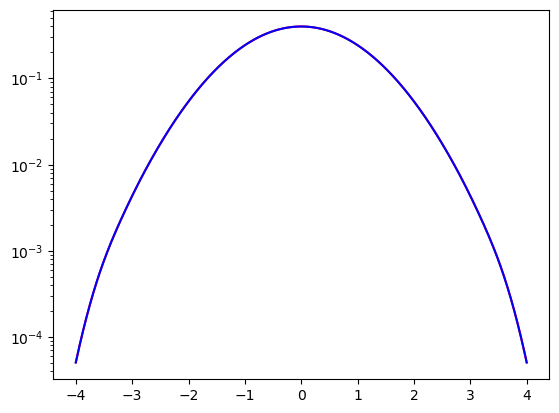

In [33]:
# Get the best zeromode and the PDF
zeromode_vqe = zeromodes[5] # P-BFGS - EfficientSU2
x_vqe, y_vqe = get_pdf(nmax, x, dx, L, shift = 0, zeromode_qpe = zeromode_vqe, normalize = True, make_even = True)

# Plot
plt.plot(x, y, 'r')
plt.plot(x_vqe, y_vqe, 'b')
plt.yscale('log')
plt.show()

### Instead, deduce the behavior of sparsity and Pauli decomposition vs. the number of qubits

In [20]:
def get_sparsity(matrix):
    # Function to compute the sparsity of a matrix

    # Initialize
    zero_elements = 0
    dimension = matrix.shape[0]

    # Compute 
    for row in range(dimension):
        for col in range(dimension):
            if matrix[row][col] == 0:
                zero_elements += 1

    return zero_elements / dimension ** 2

### Compute for a = \pm 1 (non-Hermitian case)

In [22]:
# Define qubit operator sizes
dimensions = [3, 7, 15, 31, 63, 127, 255, 511, 1023]

# Define parameters 
a = [1, -1]
gamma = 1
c = 1
L = 1/2

# Initialize 
a_positive_sparsity = []
a_negative_sparsity = []
pauli_a_positive = []
pauli_a_negative = []

# Compute sparsities
for a_val in a:
    if a_val == 1:
        for dimension in dimensions:
            matrix, _ = get_zeromode(dimension, a_val, c, L, gamma)
            sparsity = get_sparsity(matrix)
            a_positive_sparsity.append(sparsity)
    
    elif a_val == -1:
        for dimension in dimensions:
            matrix, _ = get_zeromode(dimension, a_val, c, L, gamma)
            sparsity = get_sparsity(matrix)
            a_negative_sparsity.append(sparsity)

# Compute the number of Pauli terms
for a_val in a:
    if a_val == 1:
        for dimension in dimensions:
            matrix, _ = get_zeromode(dimension, a_val, c, L, gamma)
            fpe_operator = SparsePauliOp.from_operator(matrix)
            pauli_a_positive.append(len(fpe_operator))
    
    elif a_val == -1:
        for dimension in dimensions:
            matrix, _ = get_zeromode(dimension, a_val, c, L, gamma)
            fpe_operator = SparsePauliOp.from_operator(matrix)
            pauli_a_negative.append(len(fpe_operator))

## Print the sparsity values
# For a = 1
print('The sparsity values for a = 1 are:')
print(a_positive_sparsity)
print()

# For a = -1
print('The sparsity values for a = -1 are:')
print(a_negative_sparsity)
print()

## Print the number of Pauli terms
# For a = 1
print('The number of Pauli terms for a = 1 are:')
print(pauli_a_positive)
print()

# For a = -1
print('The number of Pauli terms for a = -1 are:')
print(pauli_a_negative)
print()

KeyboardInterrupt: 

### Compute for a = \pm 1 (Hermitian and non-Hermitian cases)

In [24]:
# Define qubit operator sizes
dimensions = [3, 7, 15, 31, 63, 127, 255, 511, 1023]

# Define parameters 
a = [1, -1]
gamma = 1
c = [0, 2]
L = 1/2

# Initialize 
a_positive_sparsity_nonhermitian = []
a_positive_sparsity_hermitian = []
a_negative_sparsity_nonhermitian = []
a_negative_sparsity_hermitian = []
pauli_a_positive_nonhermitian = []
pauli_a_positive_hermitian = []
pauli_a_negative_nonhermitian = []
pauli_a_negative_hermitian = []
a_gaussian_sparsity_nonhermitian = []
a_gaussian_sparsity_hermitian = []
pauli_a_gaussian_nonhermitian = []
pauli_a_gaussian_hermitian = []

# Compute 
for a_val in a:
    for b_val in c:
        if a_val == -1 and b_val == 0:
            continue
        
        elif a_val == -1 and b_val == 2:
            for dimension in dimensions:
                matrix, _ = get_zeromode(dimension, a_val, b_val, L, gamma)
                hermitian_matrix = np.dot(matrix.T, matrix)
                fpe_operator_nonhermitian = SparsePauliOp.from_operator(matrix)
                fpe_operator_hermitian = SparsePauliOp.from_operator(hermitian_matrix)
                sparsity_nonhermitian = get_sparsity(matrix)
                sparsity_hermitian = get_sparsity(hermitian_matrix)
                pauli_a_negative_nonhermitian.append(len(fpe_operator_nonhermitian))
                pauli_a_negative_hermitian.append(len(fpe_operator_hermitian))
                a_negative_sparsity_nonhermitian.append(sparsity_nonhermitian)
                a_negative_sparsity_hermitian.append(sparsity_hermitian)
        
        elif a_val == 1 and b_val == 0:
            for dimension in dimensions:
                matrix, _ = get_zeromode(dimension, a_val, b_val, L, gamma)
                hermitian_matrix = np.dot(matrix.T, matrix)
                fpe_operator_nonhermitian = SparsePauliOp.from_operator(matrix)
                fpe_operator_hermitian = SparsePauliOp.from_operator(hermitian_matrix)
                sparsity_nonhermitian = get_sparsity(matrix)
                sparsity_hermitian = get_sparsity(hermitian_matrix)
                pauli_a_gaussian_nonhermitian.append(len(fpe_operator_nonhermitian))
                pauli_a_gaussian_hermitian.append(len(fpe_operator_hermitian))
                a_gaussian_sparsity_nonhermitian.append(sparsity_nonhermitian)
                a_gaussian_sparsity_hermitian.append(sparsity_hermitian)

        elif a_val == 1 and b_val == 2:
            for dimension in dimensions:
                matrix, _ = get_zeromode(dimension, a_val, b_val, L, gamma)
                hermitian_matrix = np.dot(matrix.T, matrix)
                fpe_operator_nonhermitian = SparsePauliOp.from_operator(matrix)
                fpe_operator_hermitian = SparsePauliOp.from_operator(hermitian_matrix)
                sparsity_nonhermitian = get_sparsity(matrix)
                sparsity_hermitian = get_sparsity(hermitian_matrix)
                pauli_a_positive_nonhermitian.append(len(fpe_operator_nonhermitian))
                pauli_a_positive_hermitian.append(len(fpe_operator_hermitian))
                a_positive_sparsity_nonhermitian.append(sparsity_nonhermitian)
                a_positive_sparsity_hermitian.append(sparsity_hermitian)

## Print the sparsity values
# For a = 1 (non-Hermitian)
print('The non-Hermitian sparsity values for a = 1 are:')
print(a_positive_sparsity_nonhermitian)
print()

# For a = 1 (Hermitian)
print('The Hermitian sparsity values for a = 1 are:')
print(a_positive_sparsity_hermitian)
print()

# For a = -1 (non-Hermitian)
print('The non-Hermitian sparsity values for a = -1 are:')
print(a_negative_sparsity_nonhermitian)
print()

# For a = -1 (Hermitian)
print('The Hermitian sparsity values for a = -1 are:')
print(a_negative_sparsity_hermitian)
print()

# For a = 1 and b = 0 (non-Hermitian)
print('The non-Hermitian sparsity values for a = 1 and b = 0 are:')
print(a_gaussian_sparsity_nonhermitian)
print()

# For a = 1 and b = 0 (Hermitian)
print('The Hermitian sparsity values for a = 1 and b = 0 are:')
print(a_gaussian_sparsity_hermitian)
print()

## Print the number of Pauli terms
# For a = 1 (non-Hermitian)
print('The number of Pauli terms for a = 1 for the non-Hermitian case are:')
print(pauli_a_positive_nonhermitian)
print()

# For a = 1 (Hermitian)
print('The number of Pauli terms for a = 1 for the Hermitian case are:')
print(pauli_a_positive_hermitian)
print()

# For a = -1 (non-Hermitian)
print('The number of Pauli terms for a = -1 for the non-Hermitian case are:')
print(pauli_a_negative_nonhermitian)
print()

# For a = -1 (Hermitian)
print('The number of Pauli terms for a = 1 for the Hermitian case are:')
print(pauli_a_negative_hermitian)
print()

# For a = 1 and b = 0 (non-Hermitian)
print('The number of Pauli terms for a = 1 and b = 0 for the non-Hermitian case are:')
print(pauli_a_gaussian_nonhermitian)
print()

# For a = 1 and b = 0 (Hermitian)
print('The number of Pauli terms for a = 1 and b = 0 for the Hermitian case are:')
print(pauli_a_gaussian_hermitian)
print()

The non-Hermitian sparsity values for a = 1 are:
[0.0, 0.0, 0.1875, 0.515625, 0.73828125, 0.8642578125, 0.930908203125, 0.96514892578125, 0.9824981689453125]

The Hermitian sparsity values for a = 1 are:
[0.0, 0.0, 0.0, 0.21875, 0.5390625, 0.751953125, 0.87158203125, 0.9346923828125, 0.967071533203125]

The non-Hermitian sparsity values for a = -1 are:
[0.0, 0.0, 0.1875, 0.515625, 0.73828125, 0.8642578125, 0.930908203125, 0.96514892578125, 0.9824981689453125]

The Hermitian sparsity values for a = -1 are:
[0.0, 0.0, 0.0, 0.21875, 0.5390625, 0.751953125, 0.87158203125, 0.9346923828125, 0.967071533203125]

The non-Hermitian sparsity values for a = 1 and b = 0 are:
[0.0, 0.125, 0.46875, 0.7109375, 0.849609375, 0.92333984375, 0.9613037109375, 0.980560302734375, 0.9902572631835938]

The Hermitian sparsity values for a = 1 and b = 0 are:
[0.0, 0.0, 0.1875, 0.515625, 0.73828125, 0.8642578125, 0.930908203125, 0.96514892578125, 0.9824981689453125]

The number of Pauli terms for a = 1 for the no

### Compare sparsities and no. of Pauli terms

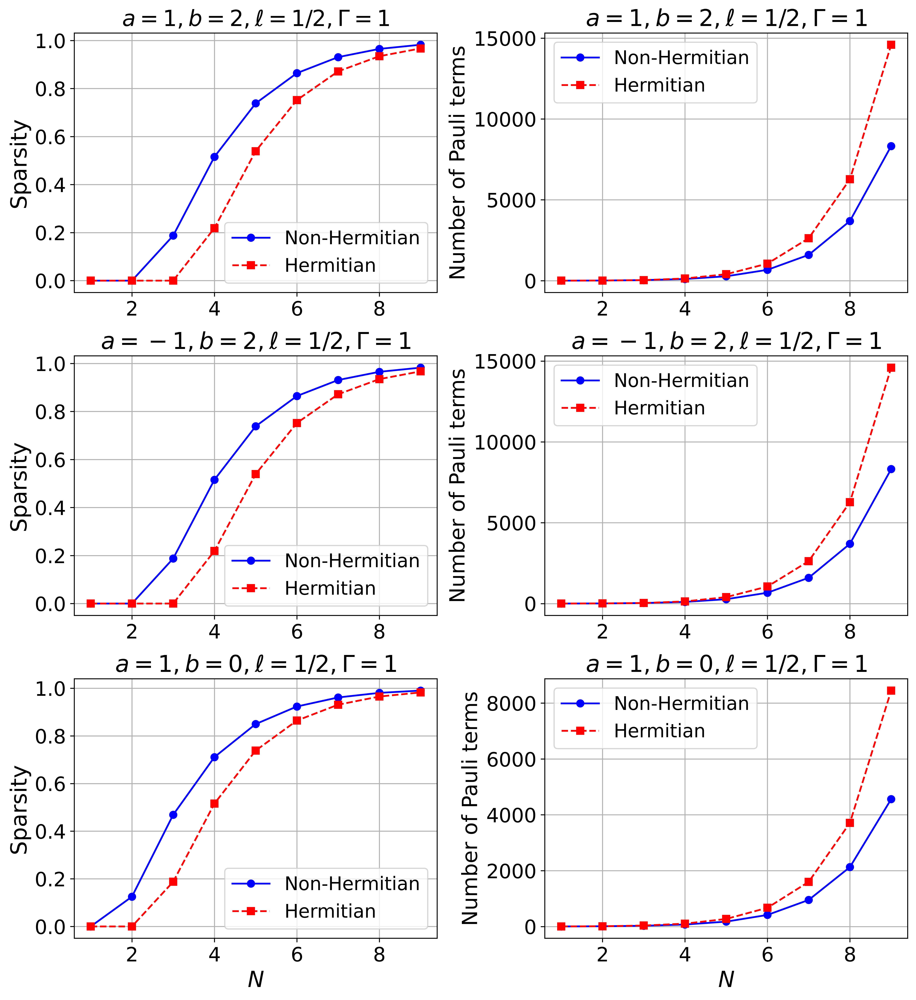

In [26]:
# # Data for the non-Hermitian case
# sparsity_non_hermitian_a1 = [0.0, 0.0, 0.1875, 0.515625, 0.73828125, 0.8642578125, 0.930908203125, 0.96514892578125, 0.9824981689453125]
# sparsity_non_hermitian_a_minus1 = [0.0, 0.0, 0.1875, 0.515625, 0.73828125, 0.8642578125, 0.930908203125, 0.96514892578125, 0.9824981689453125]
# pauli_terms_non_hermitian_a1 = [3, 10, 36, 104, 272, 672, 1598, 3694, 8314]
# pauli_terms_non_hermitian_a_minus1 = [3, 10, 36, 104, 272, 672, 1598, 3690, 8314]

# # Data for the Hermitian case
# sparsity_hermitian_a1 = [0.0, 0.0, 0.0, 0.21875, 0.5390625, 0.751953125, 0.87158203125, 0.9346923828125, 0.967071533203125]
# sparsity_hermitian_a_minus1 = [0.0, 0.0, 0.0, 0.21875, 0.5390625, 0.751953125, 0.87158203125, 0.9346923828125, 0.967071533203125]
# pauli_terms_hermitian_a1 = [3, 10, 36, 136, 400, 1056, 2624, 6272, 14592]
# pauli_terms_hermitian_a_minus1 = [3, 10, 36, 136, 400, 1056, 2624, 6272, 14592]

# X-axis values
N = [1, 2, 3, 4, 5, 6, 7, 8, 9]

# Plot settings
fig, axs = plt.subplots(3, 2, figsize=(11, 12), dpi = 600)
fig.subplots_adjust(hspace=0.6)

# Subplot 1: Sparsity values comparison for a = 1
axs[0, 0].plot(N, a_positive_sparsity_nonhermitian, marker='o', label="Non-Hermitian", linestyle='-', color='blue')
axs[0, 0].plot(N, a_positive_sparsity_hermitian, marker='s', label="Hermitian", linestyle='--', color='red')
axs[0, 0].set_title(r"$a = 1, b = 2, \ell = 1/2, \Gamma = 1$", fontsize=19)
axs[0, 0].set_ylabel("Sparsity", fontsize=19)
axs[0, 0].tick_params(axis='both', labelsize=17)
axs[0, 0].grid(True)
axs[0, 0].legend(fontsize=16, loc = 'best')

# Subplot 2: Number of Pauli terms comparison for a = 1
axs[0, 1].plot(N, pauli_a_positive_nonhermitian, marker='o', label="Non-Hermitian", linestyle='-', color='blue')
axs[0, 1].plot(N, pauli_a_positive_hermitian, marker='s', label="Hermitian", linestyle='--', color='red')
axs[0, 1].set_title(r"$a = 1, b = 2, \ell = 1/2, \Gamma = 1$", fontsize=20)
axs[0, 1].set_ylabel("Number of Pauli terms", fontsize=18)
axs[0, 1].tick_params(axis='both', labelsize=17)
axs[0, 1].grid(True)
axs[0, 1].legend(fontsize=16, loc = 'best')

# Subplot 3: Sparsity values comparison for a = -1
axs[1, 0].plot(N, a_negative_sparsity_nonhermitian, marker='o', label="Non-Hermitian", linestyle='-', color='blue')
axs[1, 0].plot(N, a_negative_sparsity_hermitian, marker='s', label="Hermitian", linestyle='--', color='red')
axs[1, 0].set_title(r"$a = -1, b = 2, \ell = 1/2, \Gamma = 1$", fontsize=20)
axs[1, 0].set_ylabel("Sparsity", fontsize=19)
axs[1, 0].tick_params(axis='both', labelsize=17)
axs[1, 0].grid(True)
axs[1, 0].legend(fontsize=16, loc = 'best')

# Subplot 4: Number of Pauli terms comparison for a = -1
axs[1, 1].plot(N, pauli_a_negative_nonhermitian, marker='o', label="Non-Hermitian", linestyle='-', color='blue')
axs[1, 1].plot(N, pauli_a_negative_hermitian, marker='s', label="Hermitian", linestyle='--', color='red')
axs[1, 1].set_title(r"$a = -1, b = 2, \ell = 1/2, \Gamma = 1$", fontsize=20)
axs[1, 1].set_ylabel("Number of Pauli terms", fontsize=18)
axs[1, 1].tick_params(axis='both', labelsize=17)
axs[1, 1].grid(True)
axs[1, 1].legend(fontsize=16, loc = 'best')

# Subplot 5: Sparsity values comparison for a = 1 and b = 0
axs[2, 0].plot(N, a_gaussian_sparsity_nonhermitian, marker='o', label="Non-Hermitian", linestyle='-', color='blue')
axs[2, 0].plot(N, a_gaussian_sparsity_hermitian, marker='s', label="Hermitian", linestyle='--', color='red')
axs[2, 0].set_title(r"$a = 1, b = 0, \ell = 1/2, \Gamma = 1$", fontsize=20)
axs[2, 0].set_xlabel(r"$N$", fontsize=19)
axs[2, 0].set_ylabel("Sparsity", fontsize=19)
axs[2, 0].tick_params(axis='both', labelsize=17)
axs[2, 0].grid(True)
axs[2, 0].legend(fontsize=16, loc = 'best')

# Subplot 6: Number of Pauli terms comparison for a = 1 and b = 0
axs[2, 1].plot(N, pauli_a_gaussian_nonhermitian, marker='o', label="Non-Hermitian", linestyle='-', color='blue')
axs[2, 1].plot(N, pauli_a_gaussian_hermitian, marker='s', label="Hermitian", linestyle='--', color='red')
axs[2, 1].set_title(r"$a = 1, b = 0, \ell = 1/2, \Gamma = 1$", fontsize=20)
axs[2, 1].set_xlabel(r"$N$", fontsize=19)
axs[2, 1].set_ylabel("Number of Pauli terms", fontsize=18)
axs[2, 1].tick_params(axis='both', labelsize=17)
axs[2, 1].grid(True)
axs[2, 1].legend(fontsize=16, loc = 'best')

# Plot parameters
plt.tight_layout(pad = 1.0)
plt.savefig('Sparsity_Pauli decomposition_comparison_FPE.pdf', bbox_inches = 'tight', dpi = 600)

### Visualizing global cost function landscapes for N = 4

In [37]:
# Define parameters
a = [1, -1]
b = [0, 2]
gamma = 1
L = 1/2
nmax = 7

## Get the FPE operators
# Initialize
hamiltonians = []

# Compute
for a_val in a:
    for b_val in b:
        if a_val == -1 and b_val == 0:
            continue
        elif a_val == 1 and b_val == 2:
            matrix, _ = get_zeromode(nmax, a_val, b_val, L, gamma)
            operator = SparsePauliOp.from_operator(matrix)
            hamiltonians.append(operator)
        elif a_val == 1 and b_val == 0:
            matrix, _ = get_zeromode(nmax, a_val, b_val, L, gamma)
            operator = SparsePauliOp.from_operator(matrix)
            hamiltonians.append(operator)
        elif a_val == -1 and b_val == 2:
            matrix, _ = get_zeromode(nmax, a_val, b_val, L, gamma)
            operator = SparsePauliOp.from_operator(matrix)
            hamiltonians.append(operator)

# Define the Ansatz
num_qubits = 2
layers = 4
ansatz = EfficientSU2(num_qubits, su2_gates=['ry'], entanglement='sca', reps=layers)

# Generate parameter vector for the ansatz
params = ParameterVector("θ", ansatz.num_parameters)
ansatz.assign_parameters(params, inplace=True)

## Import the backend and its properties
# Get the backend
backend = FakeManilaV2()

# Get the noise model 
noise_model = NoiseModel.from_backend(backend)
coupling_map = backend.coupling_map
basis_gates = noise_model.basis_gates

# Initialize the AerSimulator with the backend properties
simulator = AerSimulator(noise_model = noise_model, coupling_map = coupling_map, \
                         basis_gates = basis_gates)

# Set options
options = Options()
options.resilience_level = 0 # no error correction

# Initialize the Estimator
estimator = EstimatorNew(backend = simulator, options = options)

# Create a grid for two parameters
param1_vals = np.linspace(-np.pi, np.pi, 50)
param2_vals = np.linspace(-np.pi, np.pi, 50)
grid = np.meshgrid(param1_vals, param2_vals)

# Evaluate the cost function for all Hamiltonians
all_values = []

# Compute the cost function landscapes on the grid
for hamiltonian in hamiltonians:
    values = []
    for p1, p2 in zip(grid[0].flatten(), grid[1].flatten()):
        param_values = np.zeros(len(params))  # Initialize all parameters to 0
        param_values[0] = p1  # Vary the first parameter
        param_values[1] = p2  # Vary the second parameter

        # Evaluate expectation value
        result = estimator.run([ansatz], [hamiltonian], [param_values]).result()
        values.append(result.values[0]) 
    all_values.append(np.array(values).reshape(grid[0].shape))

C:\Users\Owner\AppData\Local\Temp\ipykernel_17796\2756441554.py:57: DeprecationWarning: The Sampler and Estimator V1 primitives have been deprecated as of qiskit-ibm-runtime 0.23.0 and will be removed no sooner than 3 months after the release date. Please use the V2 Primitives. See the `V2 migration guide <https://docs.quantum.ibm.com/api/migration-guides/v2-primitives>`_. for more details
  estimator = EstimatorNew(backend = simulator, options = options)


### Print the results

In [39]:
# Print 
print('The results are:')
print(all_values)
print()

The results are:
[array([[450.41860124, 477.15167242, 484.72561179, ..., 402.98324166,
        428.39475964, 444.7433766 ],
       [502.1822646 , 517.80371204, 545.8125563 , ..., 456.47038164,
        481.76093204, 506.37067223],
       [567.4073587 , 587.42192059, 610.78230854, ..., 517.54776743,
        543.27505147, 569.9512961 ],
       ...,
       [335.96047803, 354.15058684, 382.50669187, ..., 300.98633404,
        324.58539144, 341.82253779],
       [396.64302551, 415.97334106, 437.81948475, ..., 347.70217851,
        371.52938091, 393.49432141],
       [449.50032848, 468.4038098 , 482.07252145, ..., 401.35515452,
        436.62160488, 445.29150118]]), array([[367.39231519, 390.6909239 , 401.10270598, ..., 340.09366354,
        356.55642759, 378.20400055],
       [426.72621507, 443.69618911, 467.0179769 , ..., 375.46289879,
        406.16648712, 422.92459391],
       [470.81073266, 508.05815824, 510.60000422, ..., 430.83520187,
        461.07541882, 469.0385094 ],
       ...,
  

### Visualization

C:\Users\Owner\AppData\Local\Temp\ipykernel_17796\778653930.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(pad=1.0)


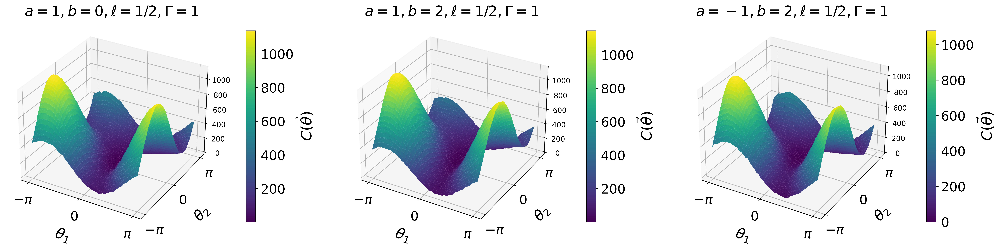

In [41]:
# Get labels
labels = [
    r"$a = 1, b = 0, \ell = 1/2, \Gamma = 1$",
    r"$a = 1, b = 2, \ell = 1/2, \Gamma = 1$",
    r"$a = -1, b = 2, \ell = 1/2, \Gamma = 1$",
]

# Plot the results in a single row with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 8), subplot_kw={"projection": "3d"}, dpi=600)

for idx, ax in enumerate(axes.flatten()):
    surface = ax.plot_surface(
        grid[0],
        grid[1],
        all_values[idx],
        cmap="viridis",
        edgecolor="none",
    )
    ax.set_xticks([-np.pi, 0, np.pi])
    ax.set_xticklabels([r"$-\pi$", r"$0$", r"$\pi$"], fontsize=18)
    ax.set_yticks([-np.pi, 0, np.pi])
    ax.set_yticklabels([r"$-\pi$", r"$0$", r"$\pi$"], fontsize=18)
    ax.set_xlabel(r"$\theta_1$", fontsize=20, labelpad=15)
    ax.set_ylabel(r"$\theta_2$", fontsize=20, labelpad=15)
    ax.zaxis.set_visible(False)
    ax.set_title(labels[idx], fontsize=20)

    # Add color bar
    cbar = fig.colorbar(surface, ax=ax, pad=0.1, shrink=0.6)
    cbar.ax.tick_params(labelsize=18)
    cbar.set_label(r"$C(\vec{\theta})$", fontsize=20)

# Adjust layout
plt.tight_layout(pad=1.0)
plt.show()

### For the noiseless cases

In [44]:
# Define the Ansatz
num_qubits = 2
layers = 4
ansatz = EfficientSU2(num_qubits, su2_gates=['ry'], entanglement='sca', reps=layers)

# Generate parameter vector for the ansatz
params = ParameterVector("θ", ansatz.num_parameters)
ansatz.assign_parameters(params, inplace=True)

# Initialize the Estimator
estimator = Estimator()

# Create a grid for two parameters
param1_vals = np.linspace(-np.pi, np.pi, 50)
param2_vals = np.linspace(-np.pi, np.pi, 50)
grid = np.meshgrid(param1_vals, param2_vals)

# Evaluate the cost function for all Hamiltonians
all_values = []

# Compute the cost function landscapes on the grid
for hamiltonian in hamiltonians:
    values = []
    for p1, p2 in zip(grid[0].flatten(), grid[1].flatten()):
        param_values = np.zeros(len(params))  # Initialize all parameters to 0
        param_values[0] = p1  # Vary the first parameter
        param_values[1] = p2  # Vary the second parameter

        # Evaluate expectation value
        result = estimator.run([ansatz], [hamiltonian], [param_values]).result()
        values.append(result.values[0]) 
    all_values.append(np.array(values).reshape(grid[0].shape))

### Print the results

In [47]:
# Print 
print('The results are:')
print(all_values)
print()

The results are:
[array([[448.75      , 469.58948132, 487.46779335, ..., 399.59926796,
        425.29153309, 448.75      ],
       [507.78063127, 529.03012162, 546.84964965, ..., 456.43801848,
        483.45009464, 507.78063127],
       [569.03566582, 590.4893347 , 608.02070421, ..., 515.82912437,
        544.01196623, 569.03566582],
       ...,
       [341.18663245, 360.61880275, 377.92648043, ..., 297.25476166,
        319.94904522, 341.18663245],
       [392.91305336, 413.14342749, 430.85018374, ..., 346.24616352,
        370.49124354, 392.91305336],
       [448.75      , 469.58948132, 487.46779335, ..., 399.59926796,
        425.29153309, 448.75      ]]), array([[376.140625  , 394.38850114, 410.04410902, ..., 333.10423148,
        355.60011022, 376.140625  ],
       [423.92007266, 443.10964758, 459.32080192, ..., 377.90976202,
        402.06716945, 423.92007266],
       [475.81429237, 495.75739101, 512.29875313, ..., 427.08322549,
        452.79692233, 475.81429237],
       ...,
  

### Visualization

C:\Users\Owner\AppData\Local\Temp\ipykernel_17796\778653930.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(pad=1.0)


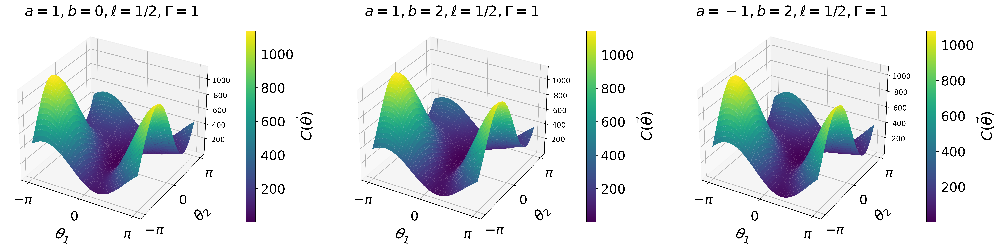

In [50]:
# Get labels
labels = [
    r"$a = 1, b = 0, \ell = 1/2, \Gamma = 1$",
    r"$a = 1, b = 2, \ell = 1/2, \Gamma = 1$",
    r"$a = -1, b = 2, \ell = 1/2, \Gamma = 1$",
]

# Plot the results in a single row with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 8), subplot_kw={"projection": "3d"}, dpi=600)

for idx, ax in enumerate(axes.flatten()):
    surface = ax.plot_surface(
        grid[0],
        grid[1],
        all_values[idx],
        cmap="viridis",
        edgecolor="none",
    )
    ax.set_xticks([-np.pi, 0, np.pi])
    ax.set_xticklabels([r"$-\pi$", r"$0$", r"$\pi$"], fontsize=18)
    ax.set_yticks([-np.pi, 0, np.pi])
    ax.set_yticklabels([r"$-\pi$", r"$0$", r"$\pi$"], fontsize=18)
    ax.set_xlabel(r"$\theta_1$", fontsize=20, labelpad=15)
    ax.set_ylabel(r"$\theta_2$", fontsize=20, labelpad=15)
    ax.zaxis.set_visible(False)
    ax.set_title(labels[idx], fontsize=20)

    # Add color bar
    cbar = fig.colorbar(surface, ax=ax, pad=0.1, shrink=0.6)
    cbar.ax.tick_params(labelsize=18)
    cbar.set_label(r"$C(\vec{\theta})$", fontsize=20)

# Adjust layout
plt.tight_layout(pad=1.0)
plt.show()

### Noisy fidelity estimation

### Extract the number of single and two qubit gates

In [28]:
def compute_gate_counts(ansatz_type, num_qubits, depth):
    """
    Compute the number of single and two-qubit gates for a given ansatz.

    Args:
        ansatz_type (str): Type of ansatz ('RealAmplitudes', 'TwoLocal', 'EfficientSU2').
        num_qubits (int): Number of qubits.
        depth (int): Depth of the ansatz.

    Returns:
        dict: Dictionary containing the number of single and two-qubit gates.
    """
    # Define the ansatz based on the type
    if ansatz_type == "RealAmplitudes":
        ansatz = RealAmplitudes(num_qubits, entanglement='full', reps=depth)
    elif ansatz_type == "TwoLocal":
        ansatz = TwoLocal(num_qubits, rotation_blocks=['ry'], entanglement_blocks='cx', reps=depth)
    elif ansatz_type == "EfficientSU2":
        ansatz = EfficientSU2(num_qubits, su2_gates = ['ry'], entanglement = 'sca', reps=depth)
    else:
        raise ValueError("Invalid ansatz type. Choose from 'RealAmplitudes', 'TwoLocal', or 'EfficientSU2'.")

    # Decompose the ansatz
    decomposed_ansatz = ansatz.decompose()

    # Count single and two-qubit gates
    single_qubit_gates = sum(1 for gate in decomposed_ansatz.data if isinstance(gate[0], Gate) and gate[0].num_qubits == 1)
    two_qubit_gates = sum(1 for gate in decomposed_ansatz.data if isinstance(gate[0], Gate) and gate[0].num_qubits == 2)

    return {
        "single_qubit_gates": single_qubit_gates,
        "two_qubit_gates": two_qubit_gates,
    }

### For a = 1 (non-Gaussian case)

### For N = 2

In [30]:
# Dictionary of minimum ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 2,
    'P_BFGS-RealAmplitudes': 3,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 1

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 3, 'two_qubit_gates': 0}
SLSQP-TwoLocal: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
SLSQP-EfficientSU2: {'single_qubit_gates': 3, 'two_qubit_gates': 0}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 4, 'two_qubit_gates': 0}
P_BFGS-TwoLocal: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
P_BFGS-EfficientSU2: {'single_qubit_gates': 4, 'two_qubit_gates': 0}


### For N = 4

In [33]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 3,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 2,
    'P_BFGS-RealAmplitudes': 3,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 2

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 8, 'two_qubit_gates': 3}
SLSQP-TwoLocal: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
SLSQP-EfficientSU2: {'single_qubit_gates': 6, 'two_qubit_gates': 2}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 8, 'two_qubit_gates': 3}
P_BFGS-TwoLocal: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
P_BFGS-EfficientSU2: {'single_qubit_gates': 8, 'two_qubit_gates': 3}


### For N = 8

In [36]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 2,
    'P_BFGS-RealAmplitudes': 4,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 2,
}

# Number of qubits in the ansatz
num_qubits = 3

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 9, 'two_qubit_gates': 6}
SLSQP-TwoLocal: {'single_qubit_gates': 6, 'two_qubit_gates': 3}
SLSQP-EfficientSU2: {'single_qubit_gates': 9, 'two_qubit_gates': 6}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 15, 'two_qubit_gates': 12}
P_BFGS-TwoLocal: {'single_qubit_gates': 6, 'two_qubit_gates': 3}
P_BFGS-EfficientSU2: {'single_qubit_gates': 9, 'two_qubit_gates': 6}


### For N = 16

In [39]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 3,
    'P_BFGS-RealAmplitudes': 1,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 4

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 12, 'two_qubit_gates': 12}
SLSQP-TwoLocal: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
SLSQP-EfficientSU2: {'single_qubit_gates': 16, 'two_qubit_gates': 12}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
P_BFGS-TwoLocal: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
P_BFGS-EfficientSU2: {'single_qubit_gates': 16, 'two_qubit_gates': 12}


### For a = -1 (non-Gaussian case)

### For N = 2

In [42]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 3,
    'P_BFGS-RealAmplitudes': 1,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 1

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 3, 'two_qubit_gates': 0}
SLSQP-TwoLocal: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
SLSQP-EfficientSU2: {'single_qubit_gates': 4, 'two_qubit_gates': 0}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
P_BFGS-TwoLocal: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
P_BFGS-EfficientSU2: {'single_qubit_gates': 4, 'two_qubit_gates': 0}


### For N = 4

In [45]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 1,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 1,
    'P_BFGS-RealAmplitudes': 1,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 1,
}

# Number of qubits in the ansatz
num_qubits = 2

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
SLSQP-TwoLocal: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
SLSQP-EfficientSU2: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
P_BFGS-TwoLocal: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
P_BFGS-EfficientSU2: {'single_qubit_gates': 4, 'two_qubit_gates': 1}


### For N = 8

In [48]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 4,
    'P_BFGS-RealAmplitudes': 2,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 2,
}

# Number of qubits in the ansatz
num_qubits = 3

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 9, 'two_qubit_gates': 6}
SLSQP-TwoLocal: {'single_qubit_gates': 6, 'two_qubit_gates': 3}
SLSQP-EfficientSU2: {'single_qubit_gates': 15, 'two_qubit_gates': 12}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 9, 'two_qubit_gates': 6}
P_BFGS-TwoLocal: {'single_qubit_gates': 6, 'two_qubit_gates': 3}
P_BFGS-EfficientSU2: {'single_qubit_gates': 9, 'two_qubit_gates': 6}


### For N = 16

In [51]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 4,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 4,
    'P_BFGS-RealAmplitudes': 2,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 4

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 20, 'two_qubit_gates': 24}
SLSQP-TwoLocal: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
SLSQP-EfficientSU2: {'single_qubit_gates': 20, 'two_qubit_gates': 16}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 12, 'two_qubit_gates': 12}
P_BFGS-TwoLocal: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
P_BFGS-EfficientSU2: {'single_qubit_gates': 16, 'two_qubit_gates': 12}


### For a = 1 (pure Gaussian case)

### For N = 2

In [54]:
# Dinctionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 2,
    'P_BFGS-RealAmplitudes': 3,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 1

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 3, 'two_qubit_gates': 0}
SLSQP-TwoLocal: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
SLSQP-EfficientSU2: {'single_qubit_gates': 3, 'two_qubit_gates': 0}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 4, 'two_qubit_gates': 0}
P_BFGS-TwoLocal: {'single_qubit_gates': 2, 'two_qubit_gates': 0}
P_BFGS-EfficientSU2: {'single_qubit_gates': 4, 'two_qubit_gates': 0}


### For N = 4

In [57]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 3,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 3,
    'P_BFGS-RealAmplitudes': 3,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 3,
}

# Number of qubits in the ansatz
num_qubits = 2

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 8, 'two_qubit_gates': 3}
SLSQP-TwoLocal: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
SLSQP-EfficientSU2: {'single_qubit_gates': 8, 'two_qubit_gates': 3}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 8, 'two_qubit_gates': 3}
P_BFGS-TwoLocal: {'single_qubit_gates': 4, 'two_qubit_gates': 1}
P_BFGS-EfficientSU2: {'single_qubit_gates': 8, 'two_qubit_gates': 3}


### For N = 8

In [60]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 2,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 3,
    'P_BFGS-RealAmplitudes': 2,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 2,
}

# Number of qubits in the ansatz
num_qubits = 3

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 9, 'two_qubit_gates': 6}
SLSQP-TwoLocal: {'single_qubit_gates': 6, 'two_qubit_gates': 3}
SLSQP-EfficientSU2: {'single_qubit_gates': 12, 'two_qubit_gates': 9}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 9, 'two_qubit_gates': 6}
P_BFGS-TwoLocal: {'single_qubit_gates': 6, 'two_qubit_gates': 3}
P_BFGS-EfficientSU2: {'single_qubit_gates': 9, 'two_qubit_gates': 6}


### For N = 16

In [63]:
# Dictionary of min. ansatz depths
ansatz_depths = {
    'SLSQP-RealAmplitudes': 1,
    'SLSQP-TwoLocal': 1,
    'SLSQP-EfficientSU2': 3,
    'P_BFGS-RealAmplitudes': 5,
    'P_BFGS-TwoLocal': 1,
    'P_BFGS-EfficientSU2': 6,
}

# Number of qubits in the ansatz
num_qubits = 4

# Filter for SLSQP and P_BFGS cases
filtered_depths = {key: value for key, value in ansatz_depths.items() if key.startswith(('SLSQP', 'P_BFGS'))}

# Compute gate counts for each case
gate_counts_results = {}
for key, depth in filtered_depths.items():
    optimizer, ansatz_type = key.split('-')
    gate_counts_results[key] = compute_gate_counts(ansatz_type, num_qubits, depth)

# Print results
for case, counts in gate_counts_results.items():
    print(f"{case}: {counts}")

SLSQP-RealAmplitudes: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
SLSQP-TwoLocal: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
SLSQP-EfficientSU2: {'single_qubit_gates': 16, 'two_qubit_gates': 12}
P_BFGS-RealAmplitudes: {'single_qubit_gates': 24, 'two_qubit_gates': 30}
P_BFGS-TwoLocal: {'single_qubit_gates': 8, 'two_qubit_gates': 6}
P_BFGS-EfficientSU2: {'single_qubit_gates': 28, 'two_qubit_gates': 24}


### Variational ansatze schematics

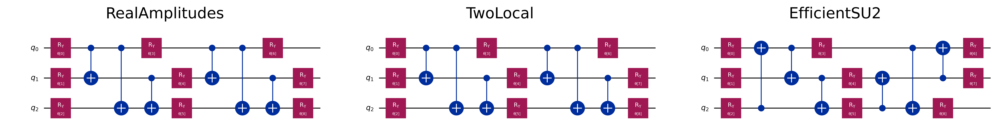

In [3]:
import matplotlib.pyplot as plt
from qiskit.circuit.library import RealAmplitudes, TwoLocal, EfficientSU2

def plot_ansatz_schematics():
    # Define the ansatze
    real_amplitudes = RealAmplitudes(num_qubits=3, entanglement = 'full', reps=2).decompose()
    two_local = TwoLocal(num_qubits=3, rotation_blocks=['ry'], entanglement_blocks='cx', reps = 2).decompose()
    efficient_su2 = EfficientSU2(num_qubits=3, su2_gates = ['ry'], entanglement = 'sca', reps=2).decompose()

    # Create a figure with subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi = 600)

    # Plot the RealAmplitudes ansatz
    axes[0].set_title("RealAmplitudes", fontsize=16)
    real_amplitudes.draw(output='mpl', ax=axes[0], scale=0.8, idle_wires=False)

    # Plot the TwoLocal ansatz
    axes[1].set_title("TwoLocal", fontsize=16)
    two_local.draw(output='mpl', ax=axes[1], scale=0.8, idle_wires=False)

    # Plot the EfficientSU2 ansatz
    axes[2].set_title("EfficientSU2", fontsize=16)
    efficient_su2.draw(output='mpl', ax=axes[2], scale=0.8, idle_wires=False)

    # Adjust layout and show the plot
    plt.tight_layout(pad = 2.0)
    plt.savefig('Ansatz schematics.pdf', bbox_inches = 'tight', dpi = 600)

# Call the function to display the schematics
plot_ansatz_schematics()